Connected to base (Python 3.11.7)

In [7]:
from FirstSteps import column_converter,feature_skew_check
from stall_margin_formulas import HPCStallMargin
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.preprocessing import PolynomialFeatures,StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
import seaborn as sns

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np




In [8]:
FD001_data_training, _ = column_converter('CMAPSSData/train_FD001.txt')

FD001_data_test, _ = column_converter('CMAPSSData/test_FD001.txt')

print(FD001_data_training.shape)
print(FD001_data_test.shape)

no failures converting dataframe columns
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20630 entries, 0 to 20629
Data columns (total 26 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Engine                                20630 non-null  int64  
 1   Cycles                                20630 non-null  int64  
 2   Operational Setting 1                 20630 non-null  float64
 3   Operational Setting 2                 20630 non-null  float64
 4   Operational Setting 3                 20630 non-null  float64
 5   Fan inlet temperature ◦R              20630 non-null  float64
 6   LPC outlet temperature ◦R             20630 non-null  float64
 7   HPC outlet temperature ◦R             20630 non-null  float64
 8   LPT outlet temperature ◦R             20630 non-null  float64
 9   Fan inlet Pressure psia               20630 non-null  float64
 10  bypass-duct pressure psia             206

In [9]:
#Istantiating formulas dataclass
hpc_training = HPCStallMargin()
FD001_data_formulas_training = hpc_training.calculate_health_metrics(FD001_data_training)
stall_margin_failure_threshold_training = hpc_training.stall_margin_failure_threshold

# add wear manifest to df

FD001_data_training['Baseline_Efficiency']= hpc_training.Baseline_Efficiency
FD001_data_training['Initial_Wear_HPT_Efficiency'] = hpc_training.Initial_Wear_HPT_Efficiency
FD001_data_training['Initial_Wear_HPT_Flow'] = hpc_training.Initial_Wear_HPT_Flow

#Wear 3000 Cycles
FD001_data_training['Wear_HPT_Efficiency_3000'] = hpc_training.Wear_HPT_Efficiency_3000
FD001_data_training['Wear_HPT_Flow_3000'] = hpc_training.Wear_HPT_Flow_3000

#Wear 6000 Cycles
FD001_data_training['Wear_HPT_Efficiency_6000'] = hpc_training.Wear_HPT_Efficiency_6000
FD001_data_training['Wear_HPT_Flow_6000'] = hpc_training.Wear_HPT_Flow_6000

In [10]:
hpc_test = HPCStallMargin()
FD001_data_formulas_test = hpc_test.calculate_health_metrics(FD001_data_test)
stall_margin_failure_threshold_test = hpc_test.stall_margin_failure_threshold

FD001_data_test['Baseline_Efficiency']= hpc_training.Baseline_Efficiency
FD001_data_test['Initial_Wear_HPT_Efficiency'] = hpc_training.Initial_Wear_HPT_Efficiency
FD001_data_test['Initial_Wear_HPT_Flow'] = hpc_training.Initial_Wear_HPT_Flow

#Wear 3000 Cycles
FD001_data_test['Wear_HPT_Efficiency_3000'] = hpc_training.Wear_HPT_Efficiency_3000
FD001_data_test['Wear_HPT_Flow_3000'] = hpc_training.Wear_HPT_Flow_3000

#Wear 6000 Cycles
FD001_data_test['Wear_HPT_Efficiency_6000'] = hpc_training.Wear_HPT_Efficiency_6000
FD001_data_test['Wear_HPT_Flow_6000'] = hpc_training.Wear_HPT_Flow_6000



In [11]:
print(FD001_data_test.isna().sum())  # Check for missing values in FD001_data_test


Engine                                  0
Cycles                                  0
Operational Setting 1                   0
Operational Setting 2                   0
Operational Setting 3                   0
Fan inlet temperature ◦R                0
LPC outlet temperature ◦R               0
HPC outlet temperature ◦R               0
LPT outlet temperature ◦R               0
Fan inlet Pressure psia                 0
bypass-duct pressure psia               0
HPC outlet pressure psia                0
Physical fan speed rpm                  0
Physical core speed rpm                 0
Engine pressure ratioP50/P2             0
HPC outlet Static pressure psia         0
Ratio of fuel flow to Ps30 pps/psia     0
Corrected fan speed rpm                 0
Corrected core speed rpm                0
Bypass Ratio                            0
Burner fuel-air ratio                   0
Bleed Enthalpy                          0
Required fan speed                      0
Required fan conversion speed     

In [16]:
# Initialize a list to store results
engine_result = []
r2_scores_data = []

unique_engines = FD001_data_training['Engine'].unique()


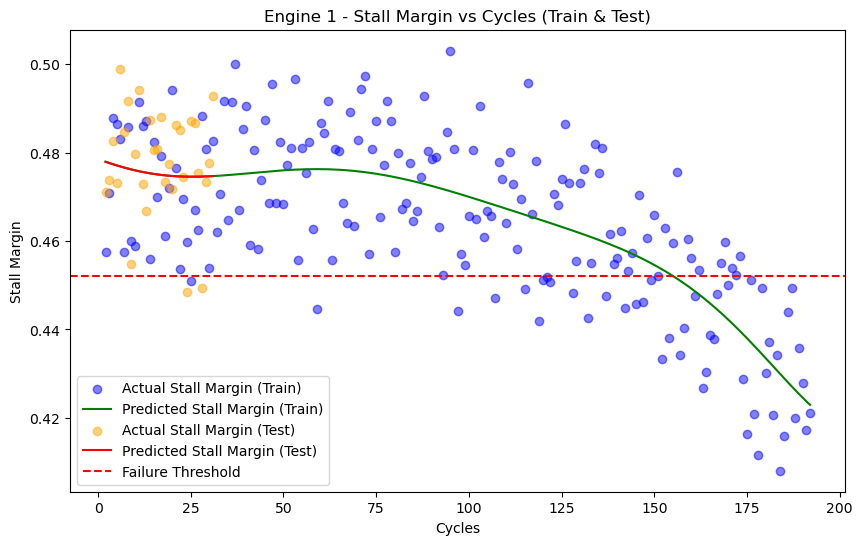

Engine 1 - R2 score (Train): 0.5503551047726781
Training: Stall margin breaches the threshold at cycle 163, predicted value 0.4473045163344565


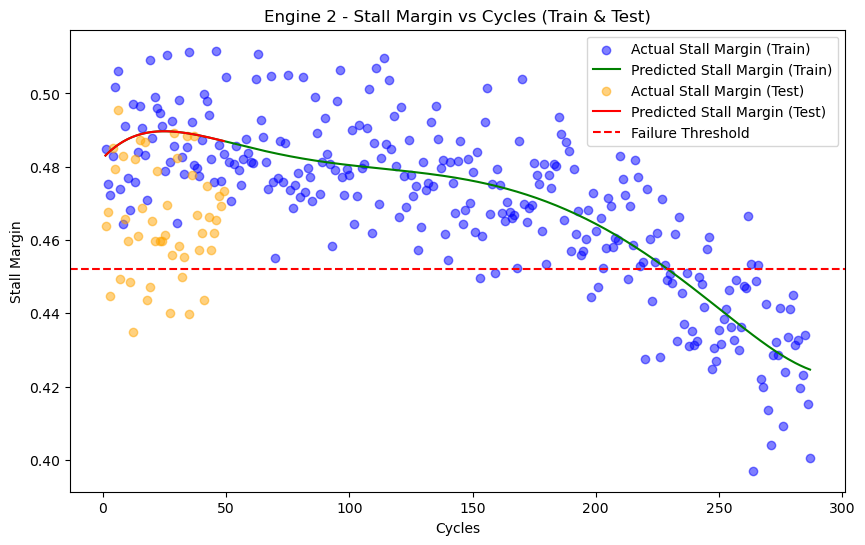

Engine 2 - R2 score (Train): 0.6904211387795134
Training: Stall margin breaches the threshold at cycle 239, predicted value 0.447109926727748


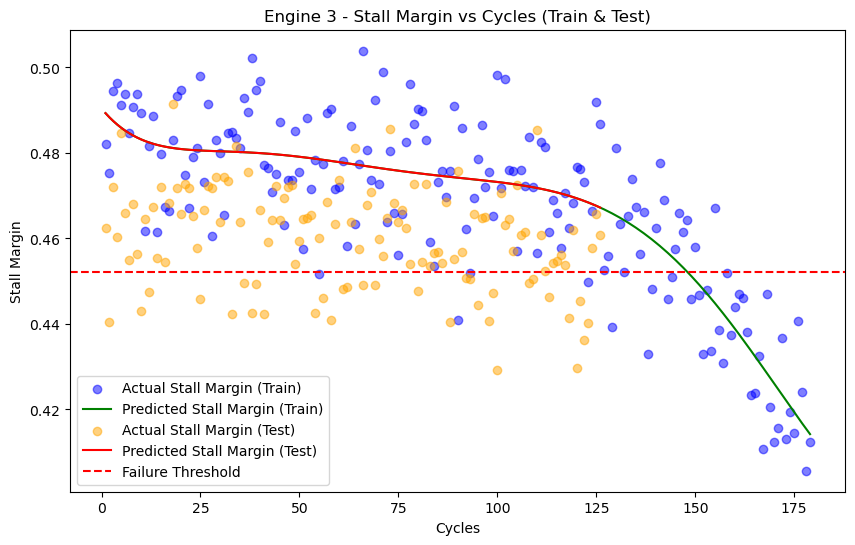

Engine 3 - R2 score (Train): 0.6876084490672367
Training: Stall margin breaches the threshold at cycle 153, predicted value 0.4470400685201557


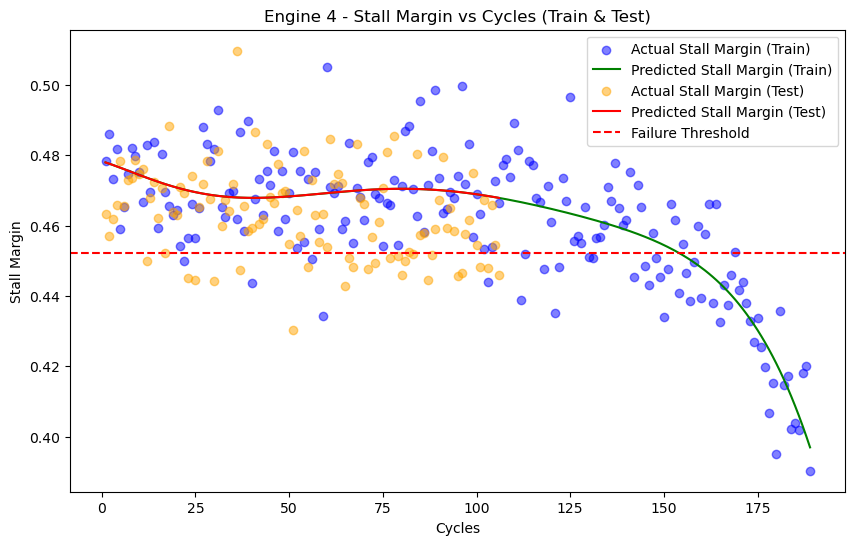

Engine 4 - R2 score (Train): 0.645269857907153
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.4472280843460399


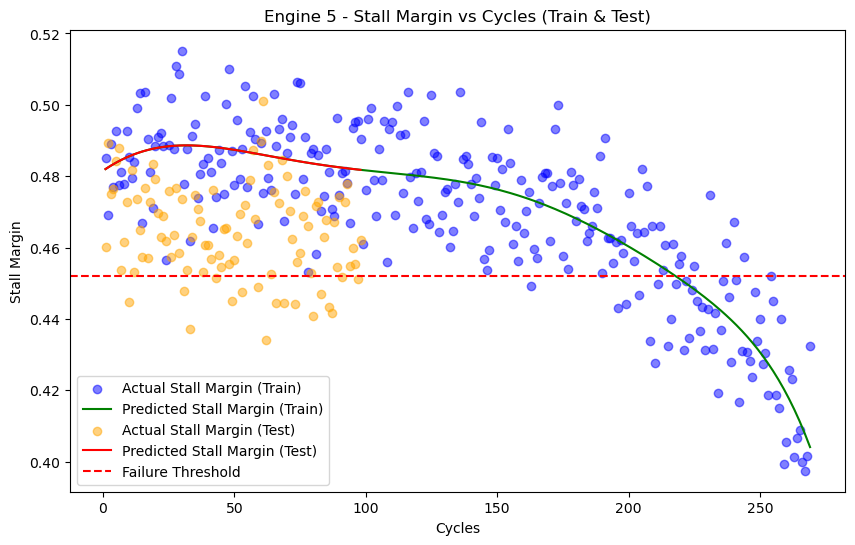

Engine 5 - R2 score (Train): 0.7182901530093061
Training: Stall margin breaches the threshold at cycle 227, predicted value 0.44719237949466495


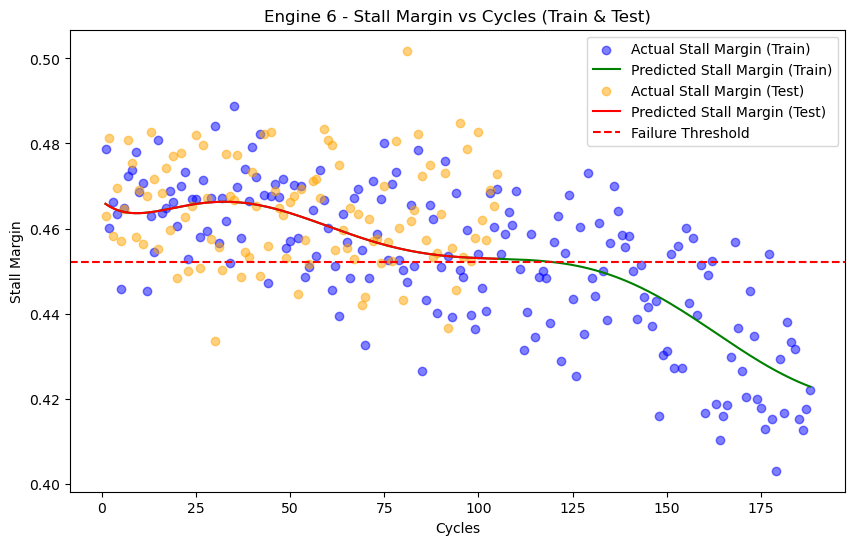

Engine 6 - R2 score (Train): 0.5376647562167549
Training: Stall margin breaches the threshold at cycle 140, predicted value 0.4473676368988269


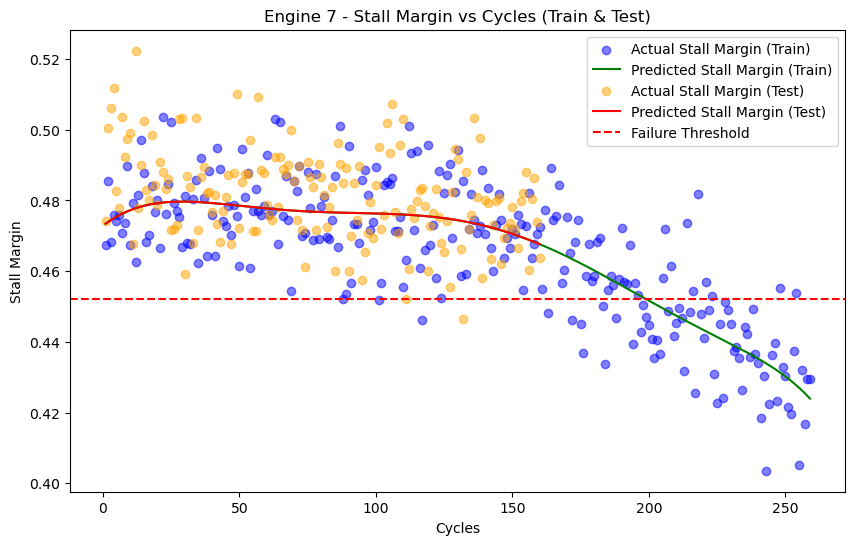

Engine 7 - R2 score (Train): 0.650276082104355
Training: Stall margin breaches the threshold at cycle 210, predicted value 0.44739189638514804


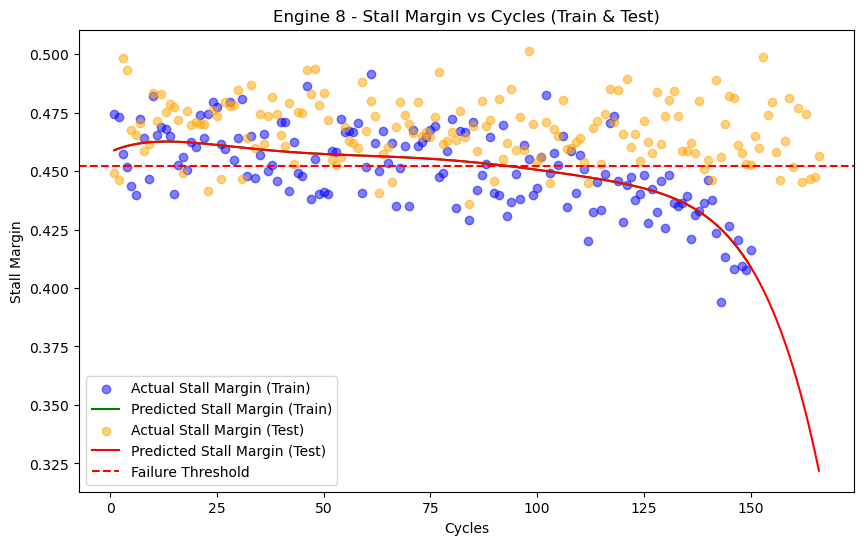

Engine 8 - R2 score (Train): 0.4816093727129591
Training: Stall margin breaches the threshold at cycle 112, predicted value 0.4473453572229163
Test: Stall margin breaches the threshold at cycle 94, predicted value 0.4519694855645911


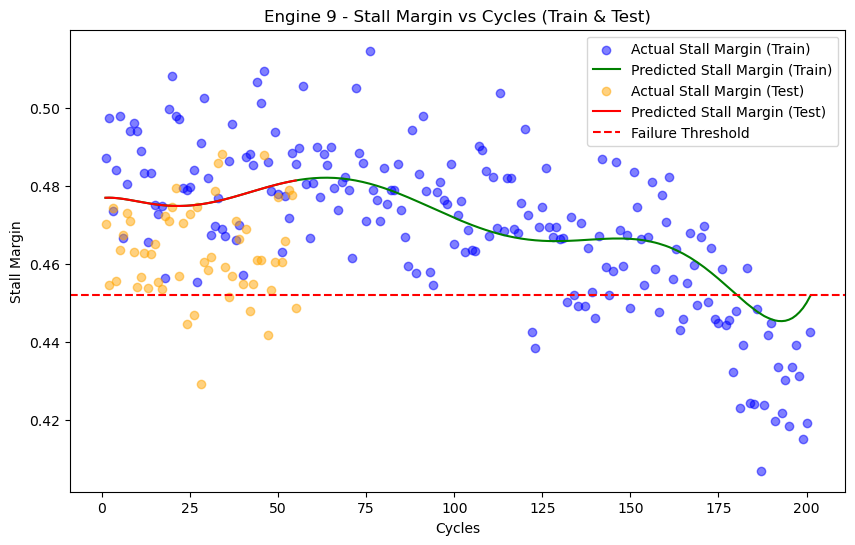

Engine 9 - R2 score (Train): 0.5240908755177438
Training: Stall margin breaches the threshold at cycle 187, predicted value 0.44719289020873076


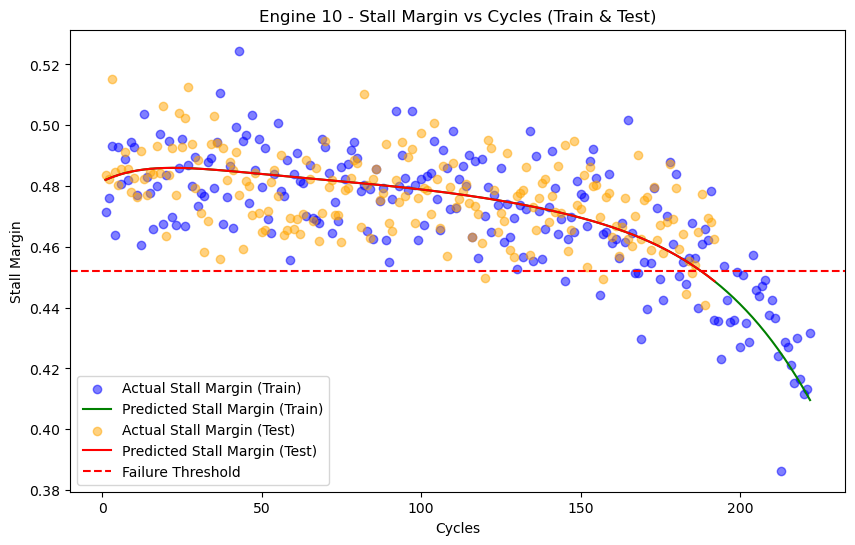

Engine 10 - R2 score (Train): 0.6218032886291778
Training: Stall margin breaches the threshold at cycle 194, predicted value 0.4469786304198225
Test: Stall margin breaches the threshold at cycle 188, predicted value 0.45187175452336864


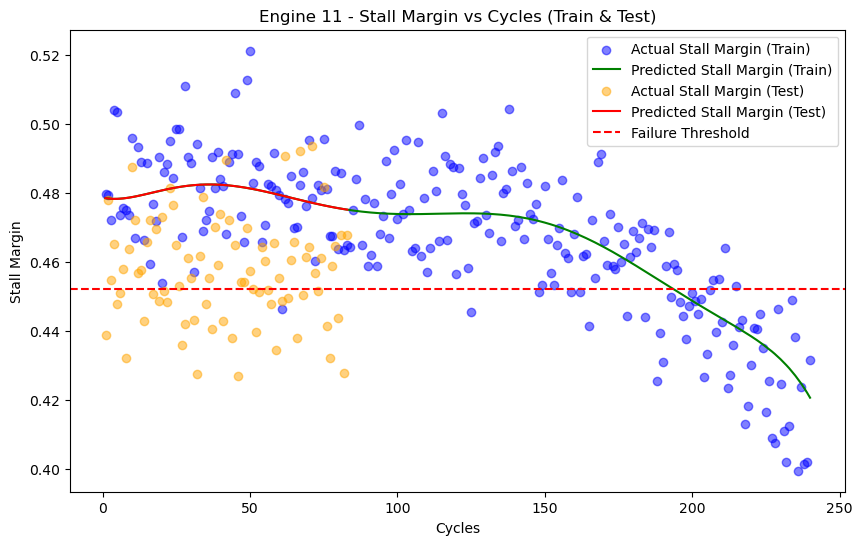

Engine 11 - R2 score (Train): 0.653687703906306
Training: Stall margin breaches the threshold at cycle 203, predicted value 0.4471134530891201


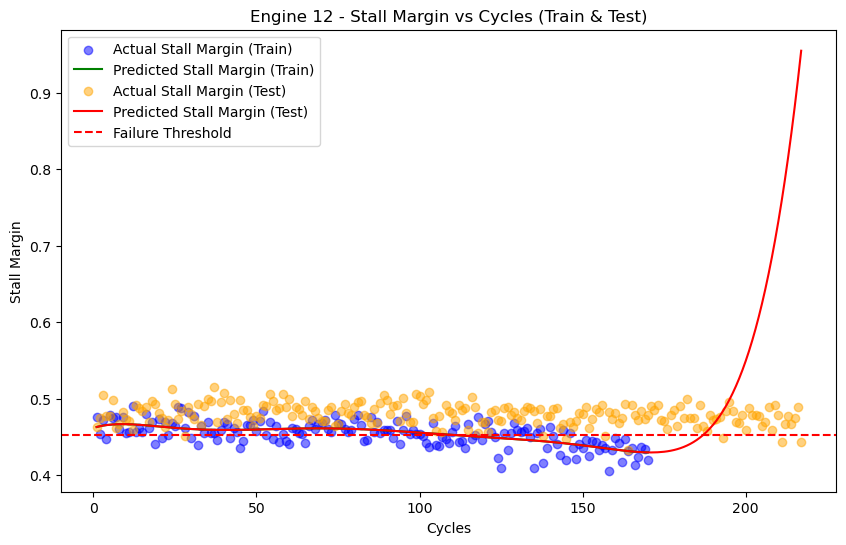

Engine 12 - R2 score (Train): 0.40561490057293215
Training: Stall margin breaches the threshold at cycle 128, predicted value 0.44732443591833676
Test: Stall margin breaches the threshold at cycle 112, predicted value 0.4518328965573814


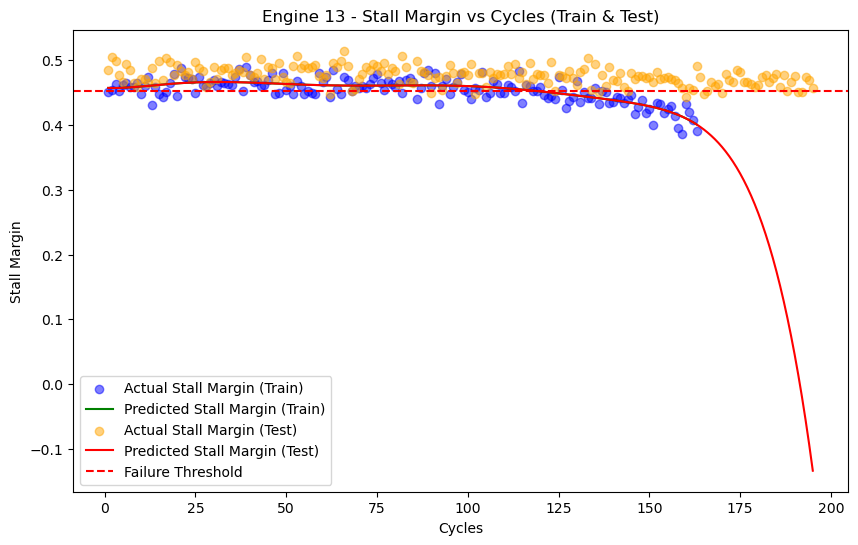

Engine 13 - R2 score (Train): 0.6030048731723203
Training: Stall margin breaches the threshold at cycle 128, predicted value 0.4469844994799454
Test: Stall margin breaches the threshold at cycle 120, predicted value 0.45199172177475283


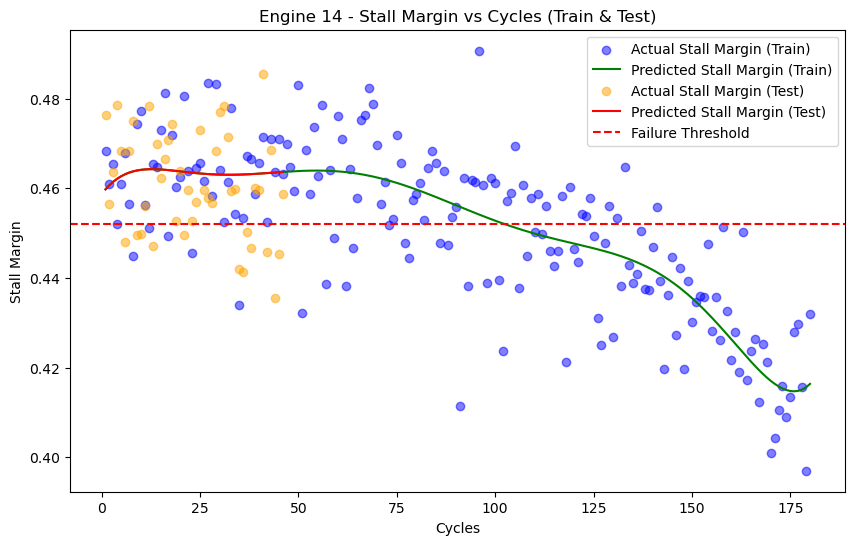

Engine 14 - R2 score (Train): 0.6097520184139045
Training: Stall margin breaches the threshold at cycle 121, predicted value 0.44746422873059194


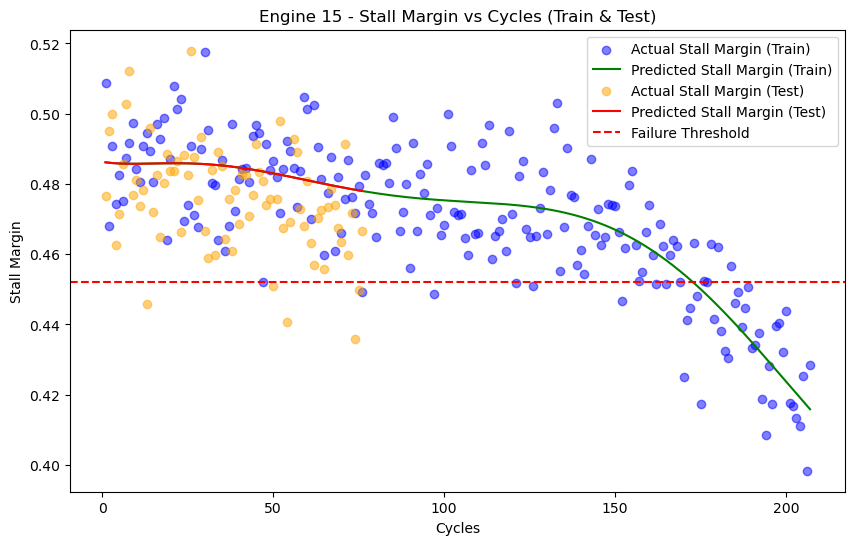

Engine 15 - R2 score (Train): 0.6776963388427012
Training: Stall margin breaches the threshold at cycle 178, predicted value 0.4472937311941621


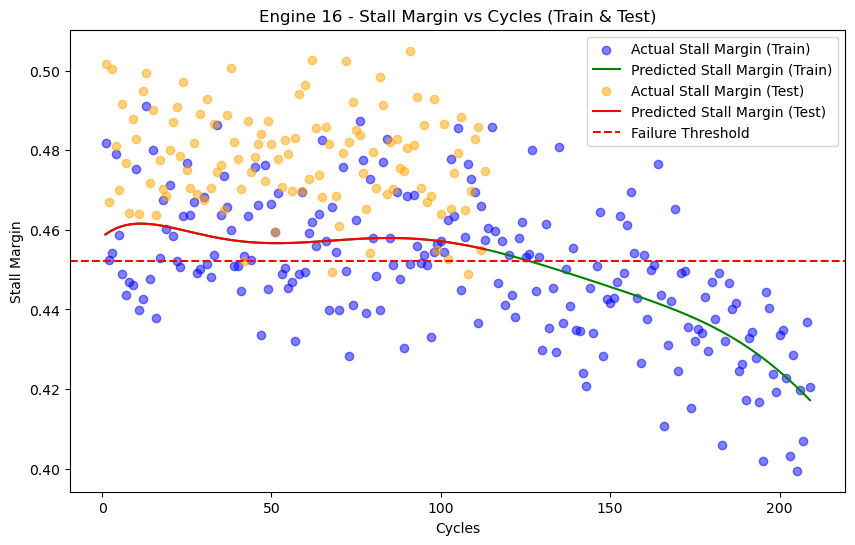

Engine 16 - R2 score (Train): 0.40346630666598526
Training: Stall margin breaches the threshold at cycle 144, predicted value 0.4473651062937962


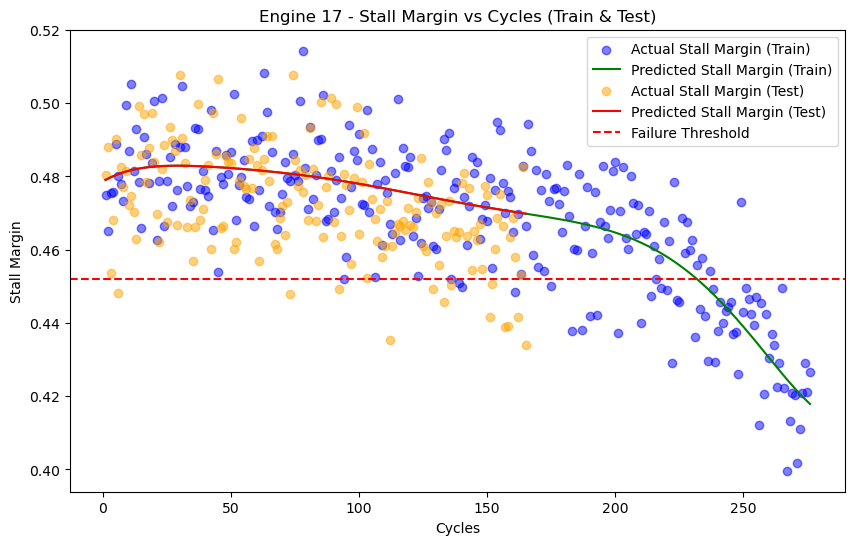

Engine 17 - R2 score (Train): 0.6518670735791848
Training: Stall margin breaches the threshold at cycle 239, predicted value 0.4473465243413292


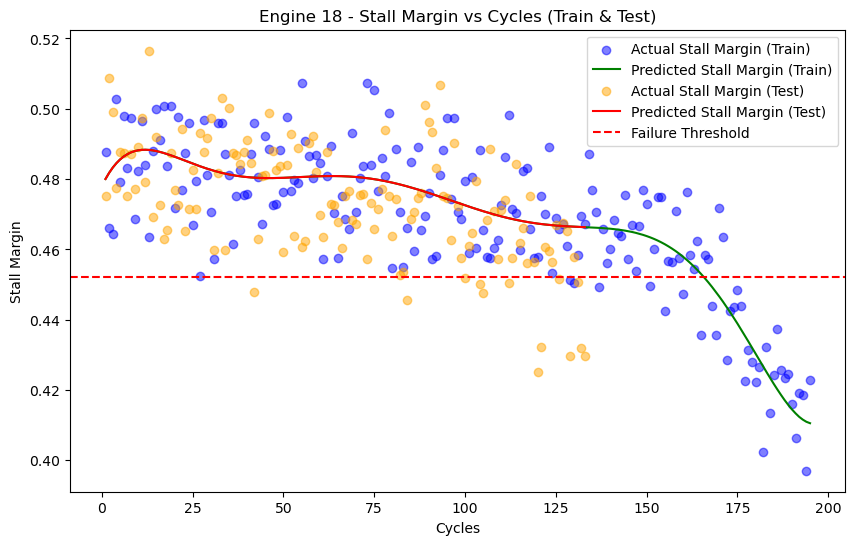

Engine 18 - R2 score (Train): 0.6987807687822618
Training: Stall margin breaches the threshold at cycle 170, predicted value 0.44660937092033837


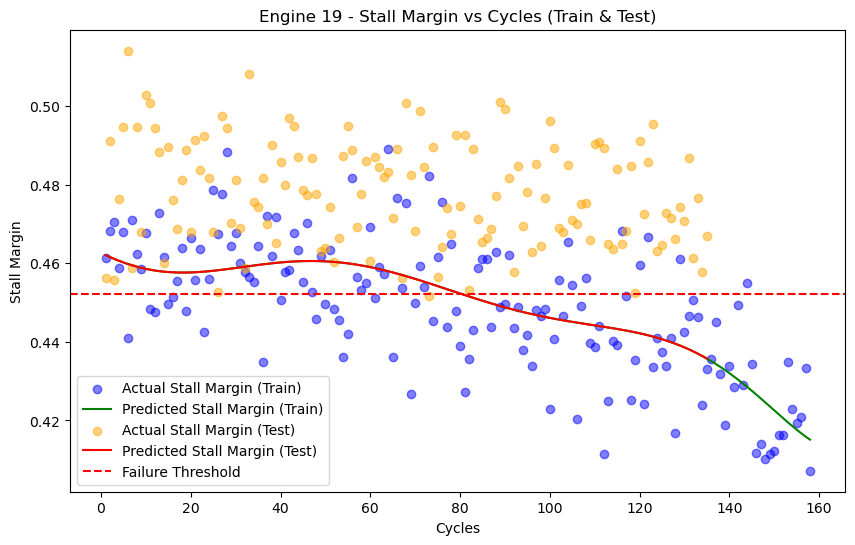

Engine 19 - R2 score (Train): 0.4886184607601327
Training: Stall margin breaches the threshold at cycle 95, predicted value 0.44731819958548913
Test: Stall margin breaches the threshold at cycle 81, predicted value 0.45191975639324555


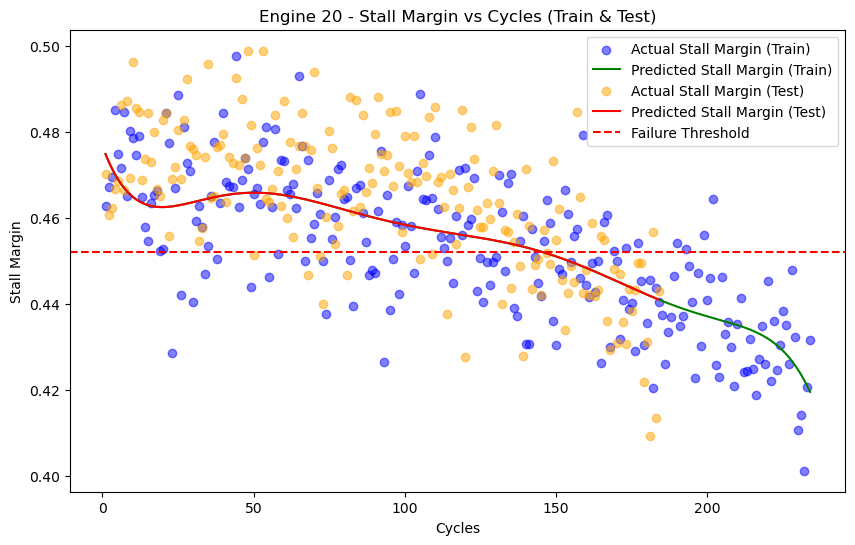

Engine 20 - R2 score (Train): 0.5390132983608343
Training: Stall margin breaches the threshold at cycle 163, predicted value 0.44743450573650745
Test: Stall margin breaches the threshold at cycle 146, predicted value 0.451913394148048


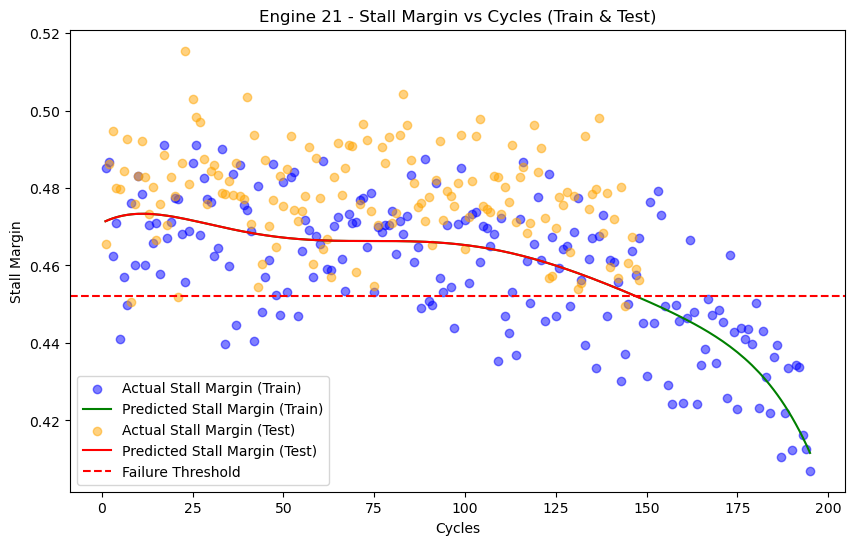

Engine 21 - R2 score (Train): 0.501969638525551
Training: Stall margin breaches the threshold at cycle 158, predicted value 0.4473877001113536
Test: Stall margin breaches the threshold at cycle 147, predicted value 0.4520916986770274


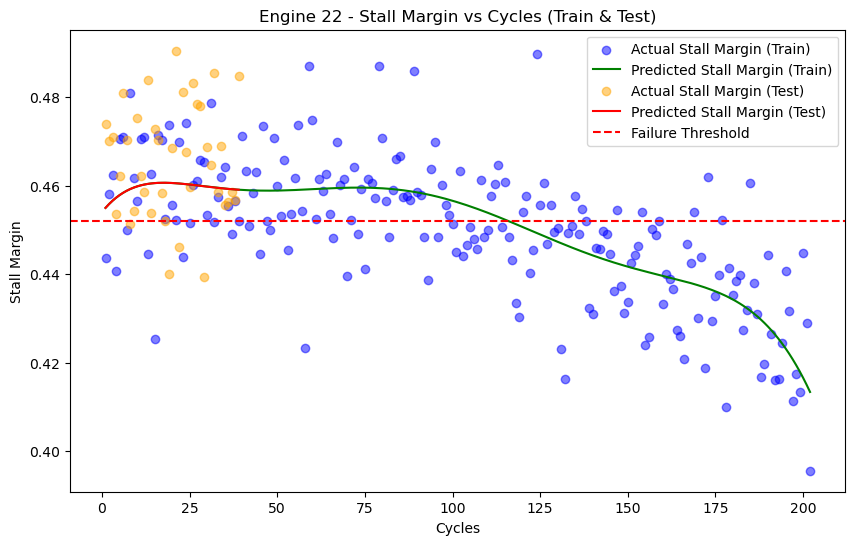

Engine 22 - R2 score (Train): 0.480147650029183
Training: Stall margin breaches the threshold at cycle 130, predicted value 0.44730643049952984


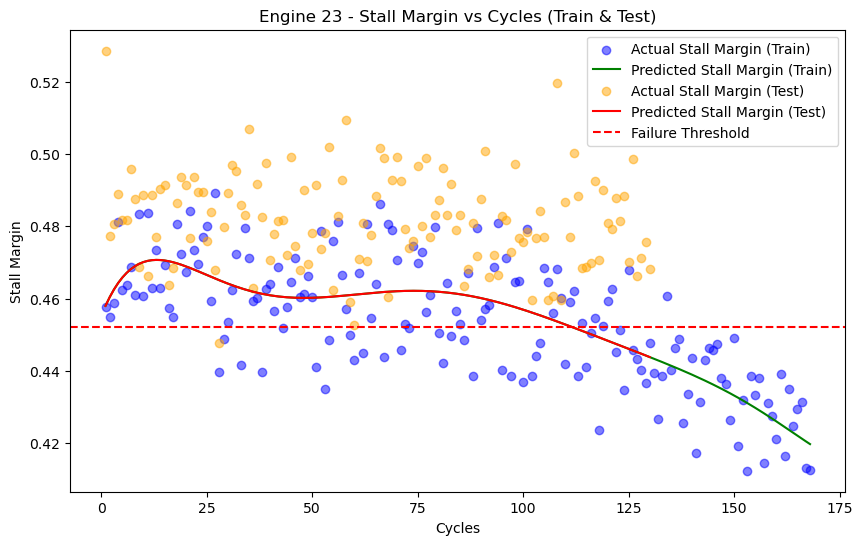

Engine 23 - R2 score (Train): 0.5460357187636226
Training: Stall margin breaches the threshold at cycle 122, predicted value 0.44750805172057506
Test: Stall margin breaches the threshold at cycle 112, predicted value 0.4519867414693689


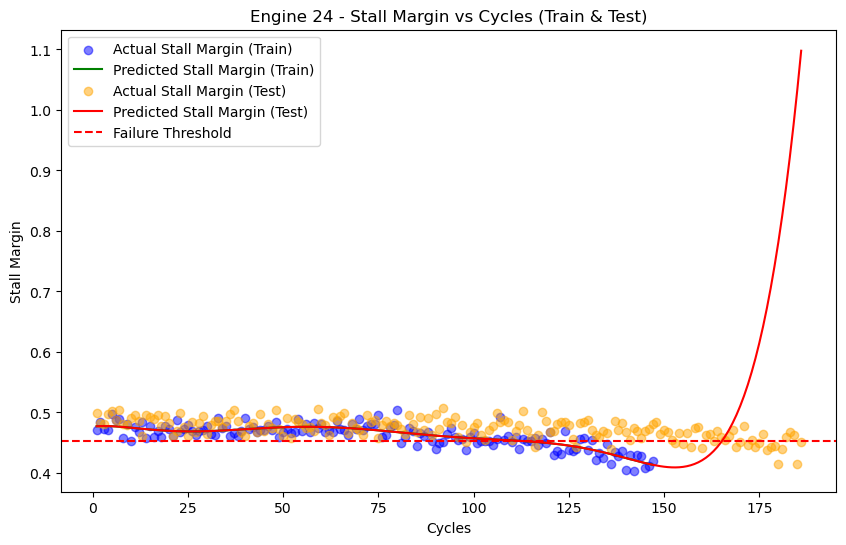

Engine 24 - R2 score (Train): 0.6857117667161592
Training: Stall margin breaches the threshold at cycle 123, predicted value 0.44703168174200675
Test: Stall margin breaches the threshold at cycle 115, predicted value 0.45194833942113893


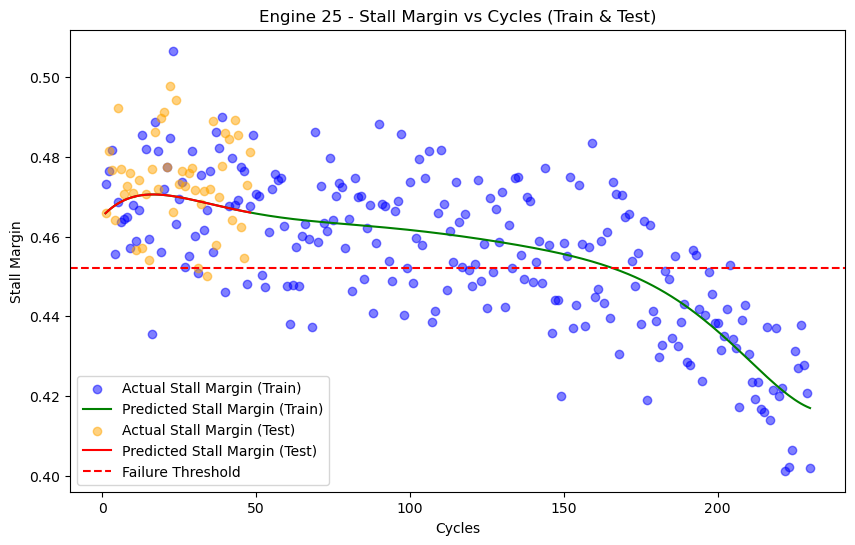

Engine 25 - R2 score (Train): 0.5499272246489926
Training: Stall margin breaches the threshold at cycle 180, predicted value 0.4472293595656657


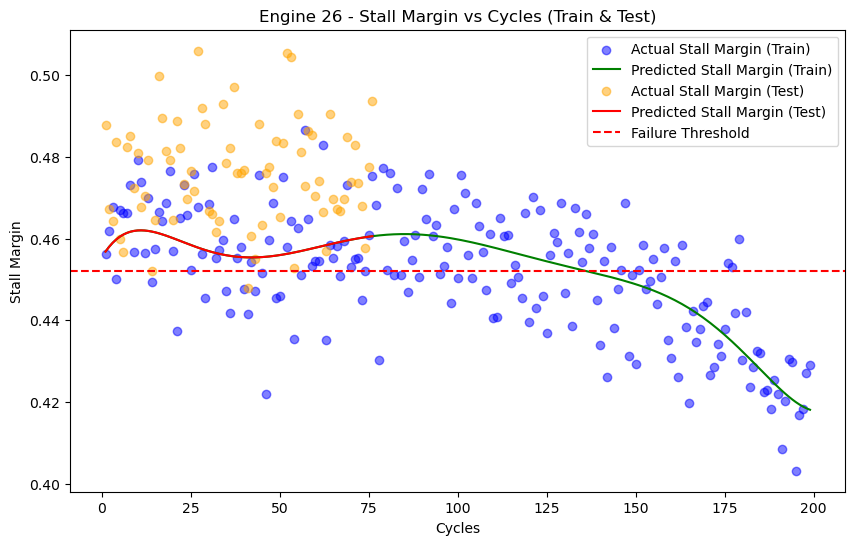

Engine 26 - R2 score (Train): 0.5014951332907951
Training: Stall margin breaches the threshold at cycle 155, predicted value 0.4472823596994682


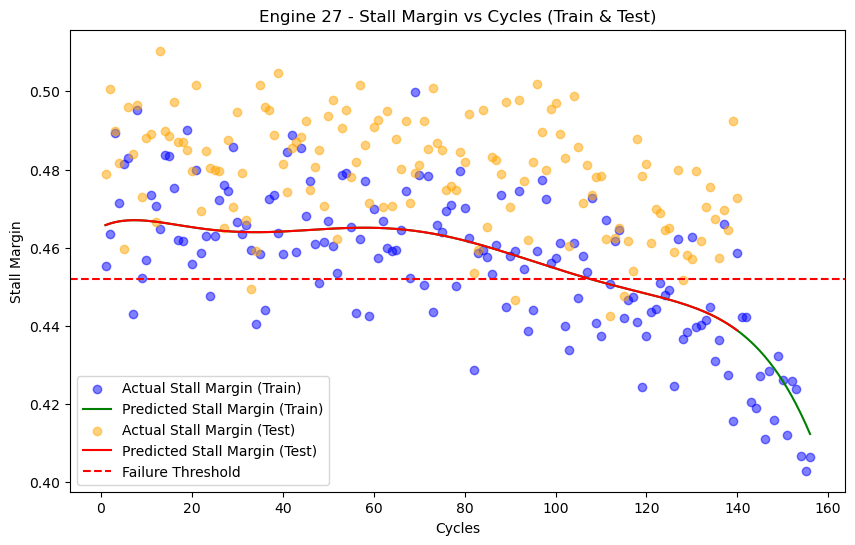

Engine 27 - R2 score (Train): 0.5721679255364596
Training: Stall margin breaches the threshold at cycle 123, predicted value 0.4473401435681993
Test: Stall margin breaches the threshold at cycle 108, predicted value 0.45187400440065206


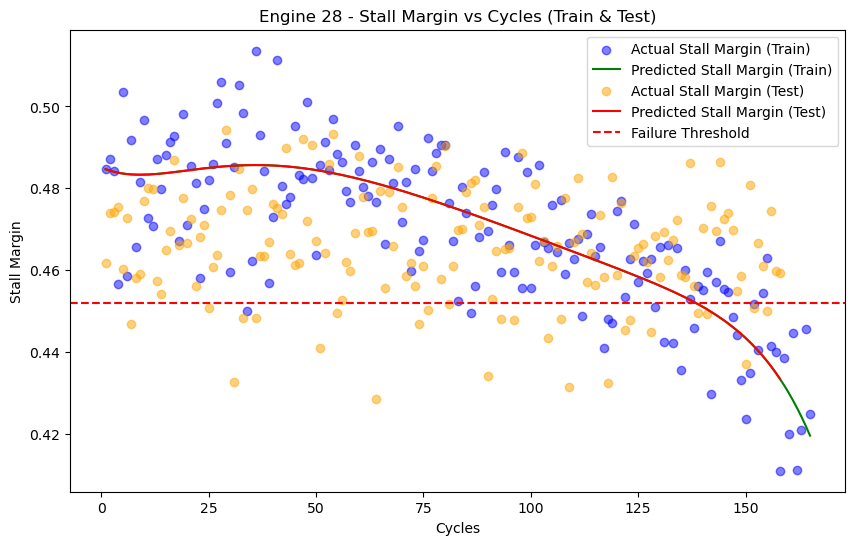

Engine 28 - R2 score (Train): 0.6116384369425942
Training: Stall margin breaches the threshold at cycle 146, predicted value 0.4469774347742068
Test: Stall margin breaches the threshold at cycle 139, predicted value 0.4516904932458865


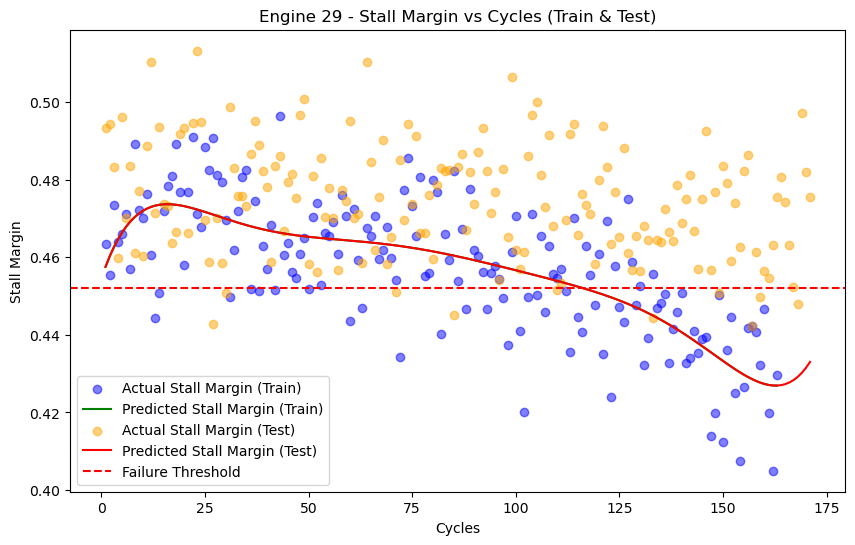

Engine 29 - R2 score (Train): 0.5337939721146198
Training: Stall margin breaches the threshold at cycle 129, predicted value 0.4470876761282416
Test: Stall margin breaches the threshold at cycle 117, predicted value 0.45178241641620115


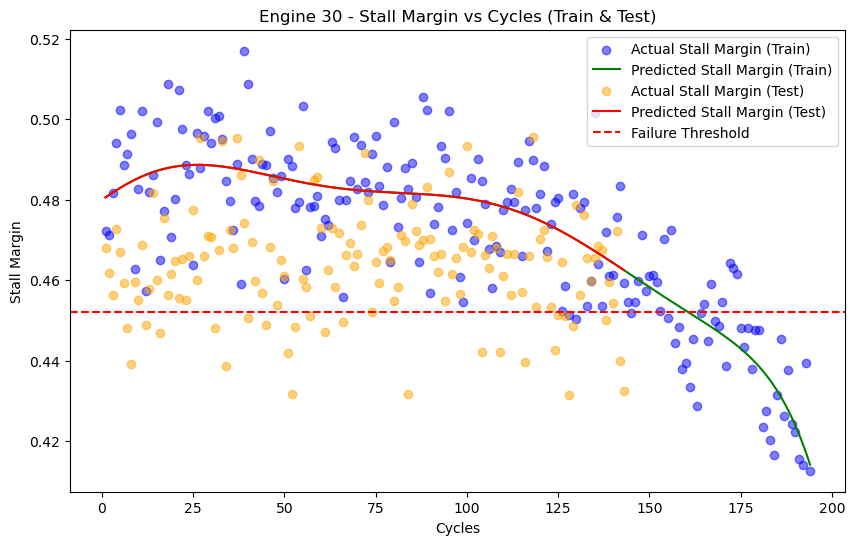

Engine 30 - R2 score (Train): 0.6846663228924773
Training: Stall margin breaches the threshold at cycle 169, predicted value 0.44711131072033167


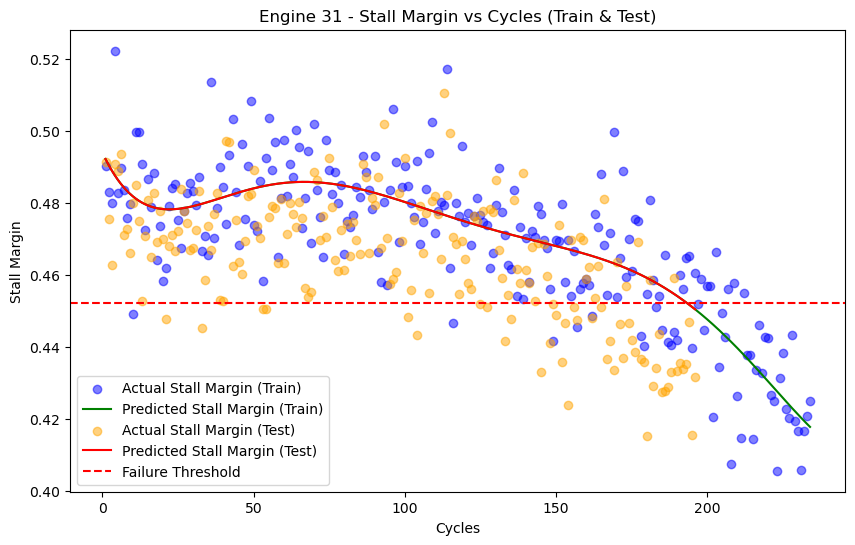

Engine 31 - R2 score (Train): 0.6711168486900225
Training: Stall margin breaches the threshold at cycle 201, predicted value 0.4468573149047418
Test: Stall margin breaches the threshold at cycle 194, predicted value 0.4516946158423937


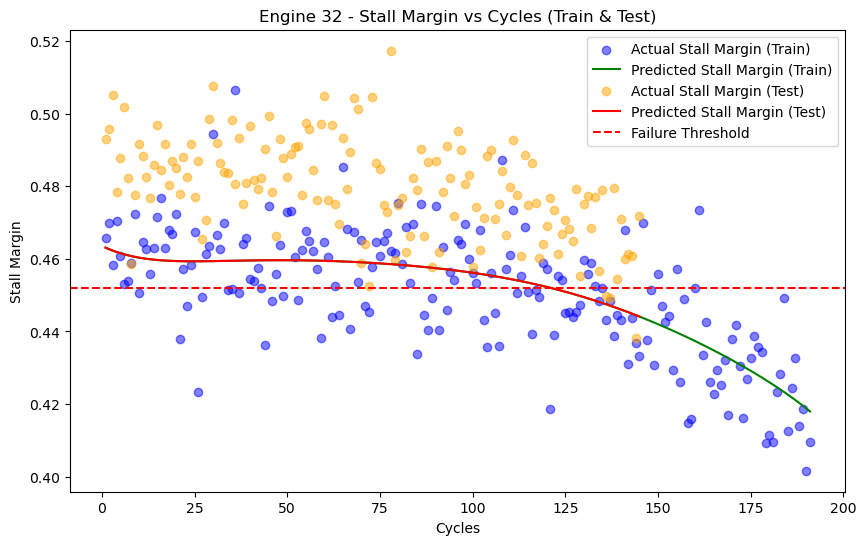

Engine 32 - R2 score (Train): 0.5081290266930014
Training: Stall margin breaches the threshold at cycle 136, predicted value 0.4474845552722954
Test: Stall margin breaches the threshold at cycle 121, predicted value 0.4520086670200371


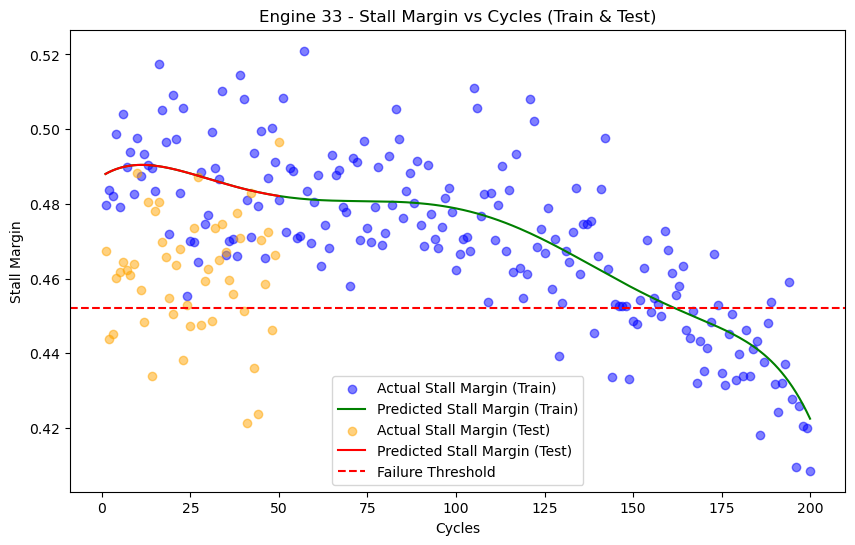

Engine 33 - R2 score (Train): 0.6510107238443038
Training: Stall margin breaches the threshold at cycle 173, predicted value 0.4475049674846975


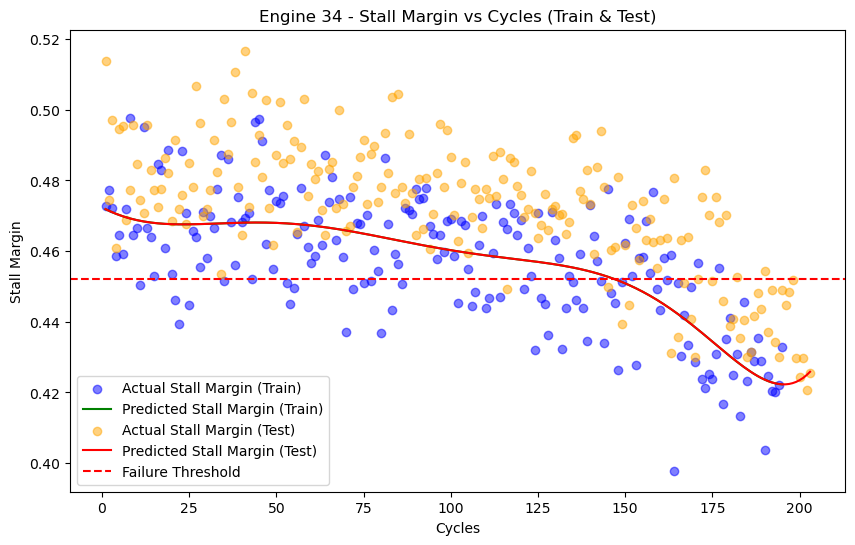

Engine 34 - R2 score (Train): 0.49267957453862743
Training: Stall margin breaches the threshold at cycle 157, predicted value 0.4474166005896713
Test: Stall margin breaches the threshold at cycle 147, predicted value 0.45204499811402815


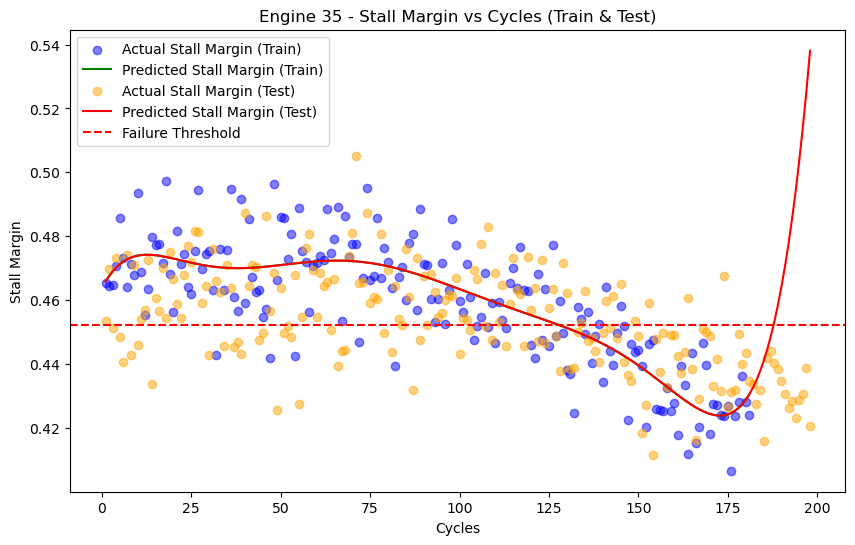

Engine 35 - R2 score (Train): 0.6643080296991568
Training: Stall margin breaches the threshold at cycle 138, predicted value 0.4475025651942318
Test: Stall margin breaches the threshold at cycle 129, predicted value 0.45174463812386


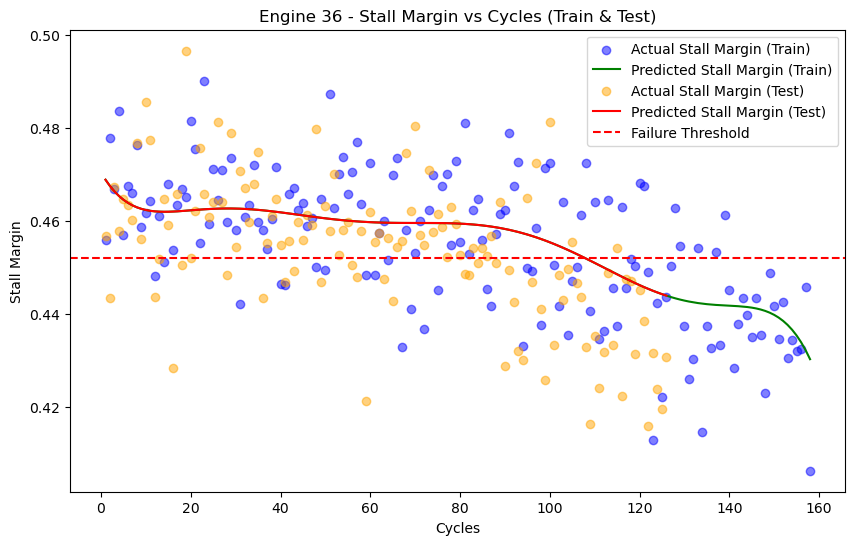

Engine 36 - R2 score (Train): 0.41803789111307443
Training: Stall margin breaches the threshold at cycle 118, predicted value 0.4471364379544079
Test: Stall margin breaches the threshold at cycle 108, predicted value 0.4519759178776562


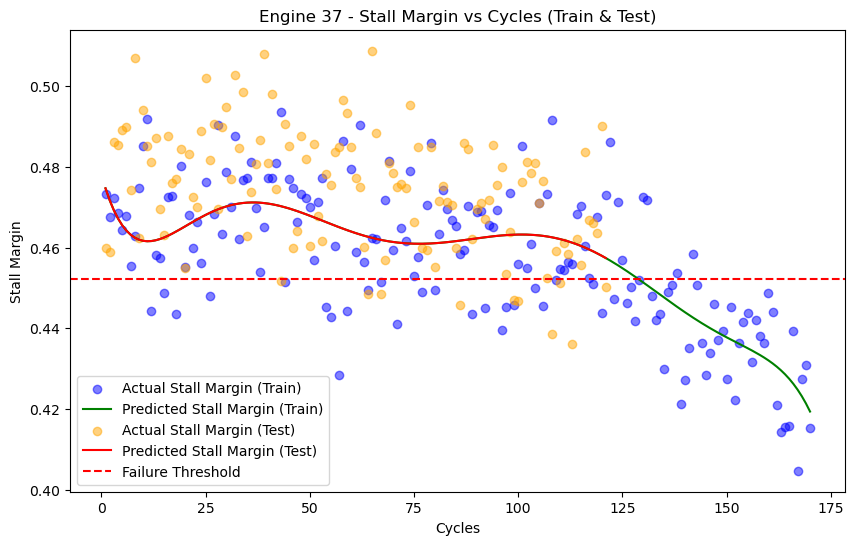

Engine 37 - R2 score (Train): 0.5228398506754823
Training: Stall margin breaches the threshold at cycle 136, predicted value 0.44684726381984496


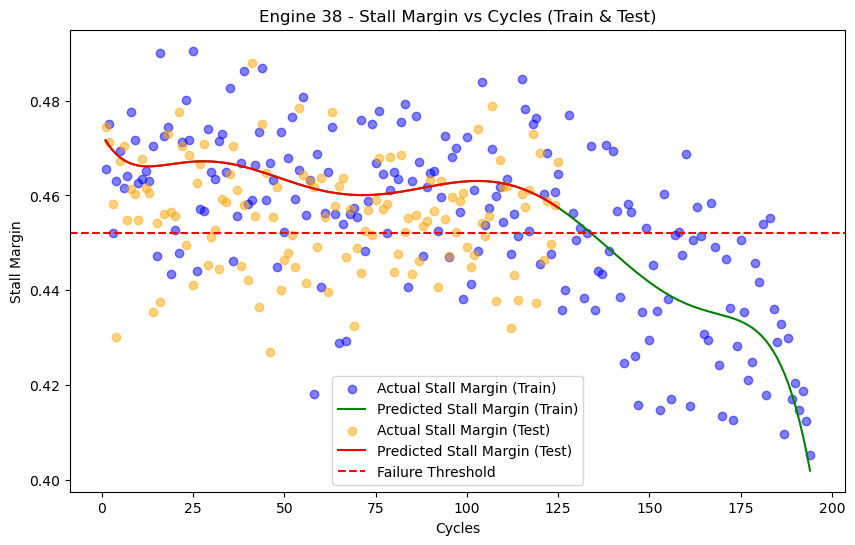

Engine 38 - R2 score (Train): 0.4778455225395506
Training: Stall margin breaches the threshold at cycle 141, predicted value 0.447364458773491


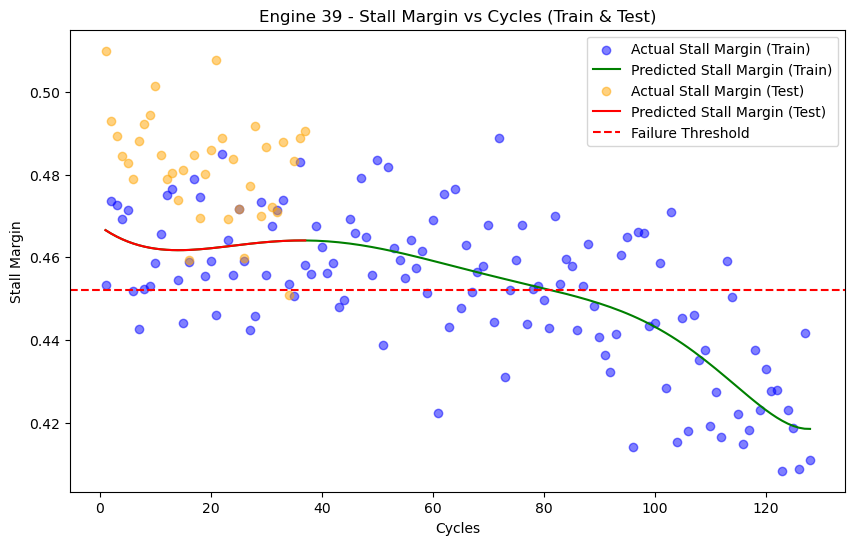

Engine 39 - R2 score (Train): 0.49217314024427194
Training: Stall margin breaches the threshold at cycle 93, predicted value 0.44745662958250754


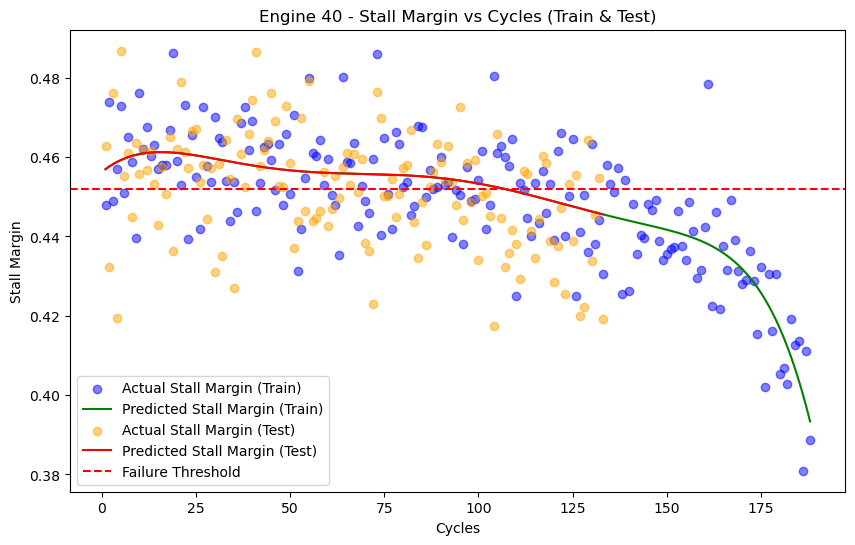

Engine 40 - R2 score (Train): 0.6090403859693841
Training: Stall margin breaches the threshold at cycle 126, predicted value 0.4473075541709128
Test: Stall margin breaches the threshold at cycle 107, predicted value 0.45197595525947837


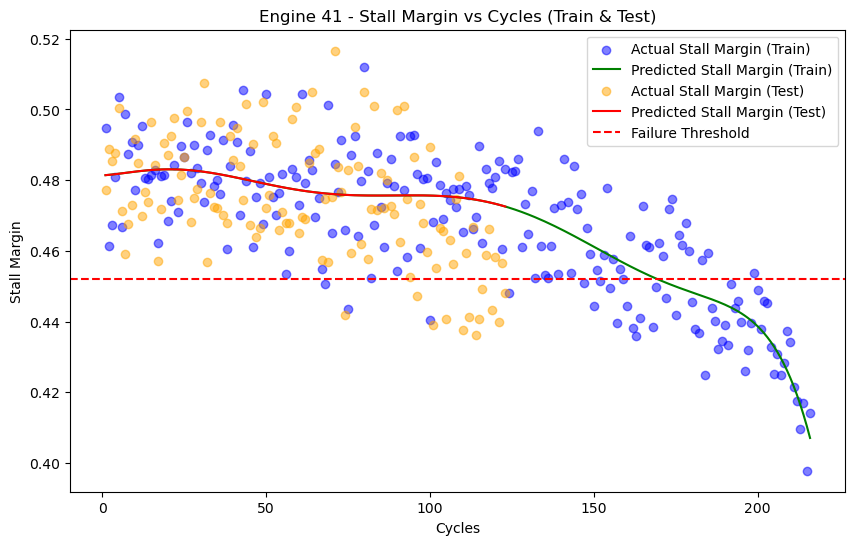

Engine 41 - R2 score (Train): 0.6606594446501686
Training: Stall margin breaches the threshold at cycle 183, predicted value 0.4472836363595985


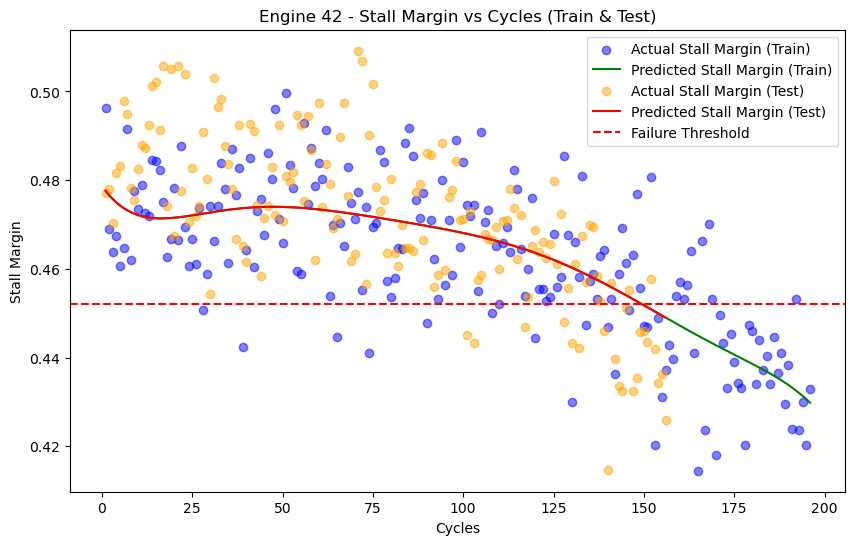

Engine 42 - R2 score (Train): 0.5303051213426551
Training: Stall margin breaches the threshold at cycle 160, predicted value 0.44716793148476514
Test: Stall margin breaches the threshold at cycle 150, predicted value 0.4517970833804074


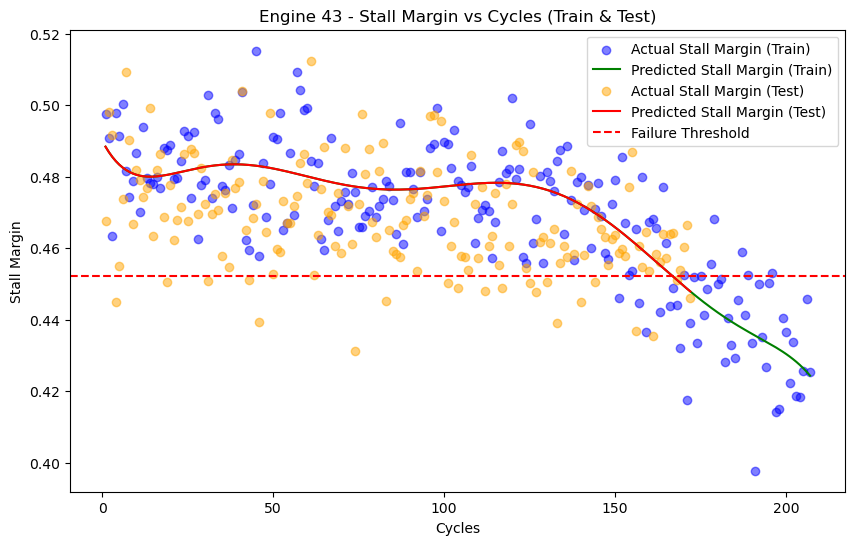

Engine 43 - R2 score (Train): 0.6545109110909588
Training: Stall margin breaches the threshold at cycle 173, predicted value 0.4471137282276988
Test: Stall margin breaches the threshold at cycle 167, predicted value 0.4519691300416827


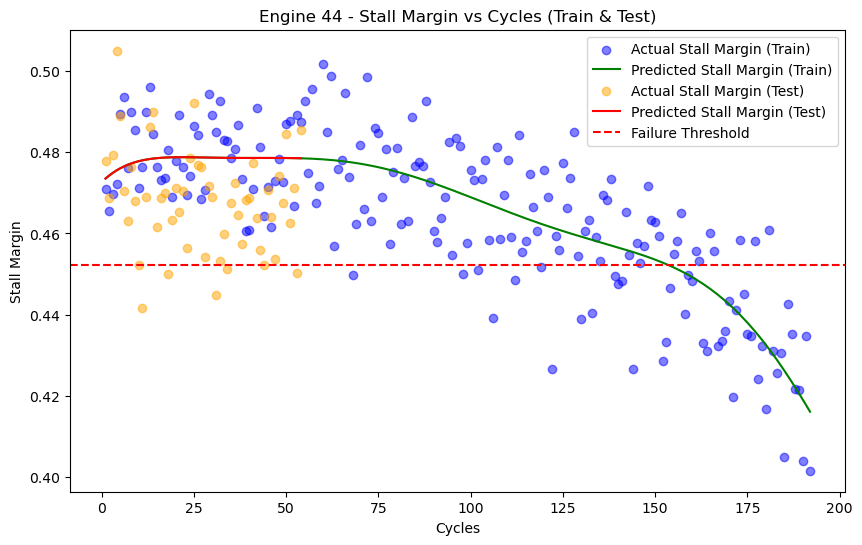

Engine 44 - R2 score (Train): 0.6508158402950517
Training: Stall margin breaches the threshold at cycle 164, predicted value 0.4469285872850091


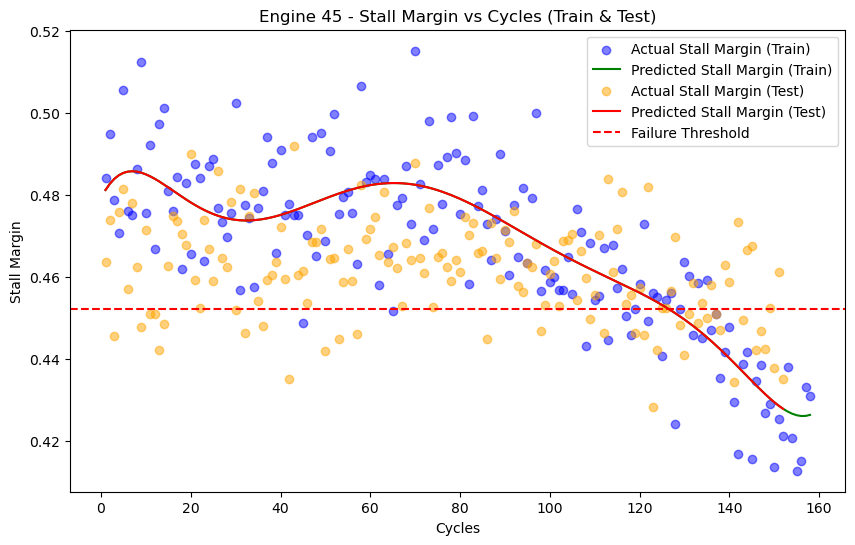

Engine 45 - R2 score (Train): 0.7003196620654841
Training: Stall margin breaches the threshold at cycle 133, predicted value 0.44704372754418475
Test: Stall margin breaches the threshold at cycle 127, predicted value 0.4517494136663638


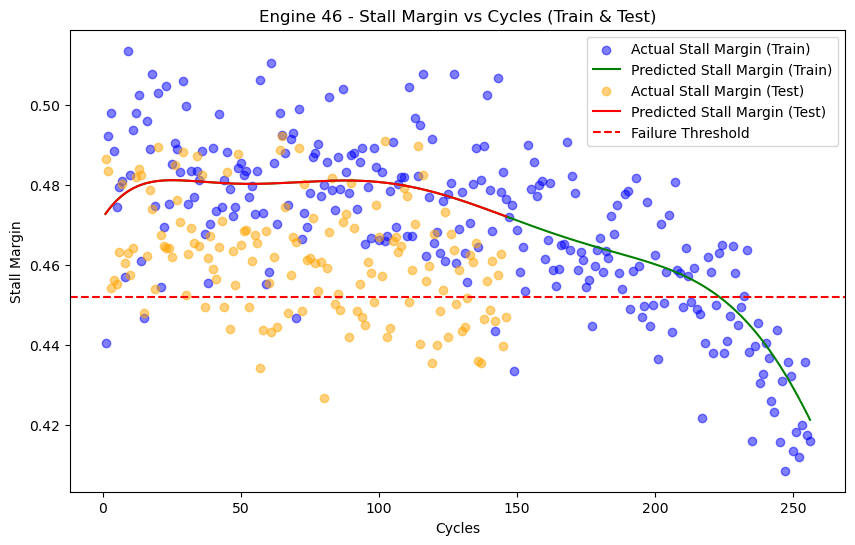

Engine 46 - R2 score (Train): 0.6018936313530273
Training: Stall margin breaches the threshold at cycle 231, predicted value 0.4472985057980069


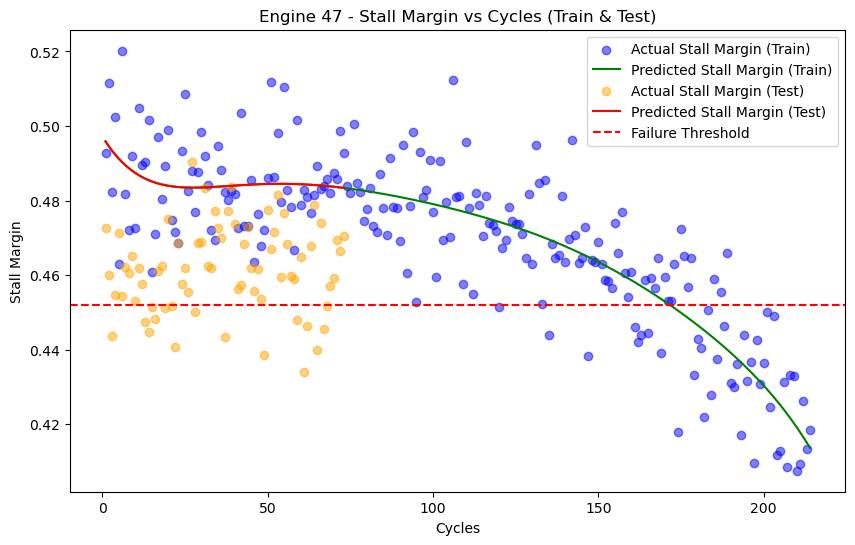

Engine 47 - R2 score (Train): 0.717047437593433
Training: Stall margin breaches the threshold at cycle 179, predicted value 0.4472584963997359


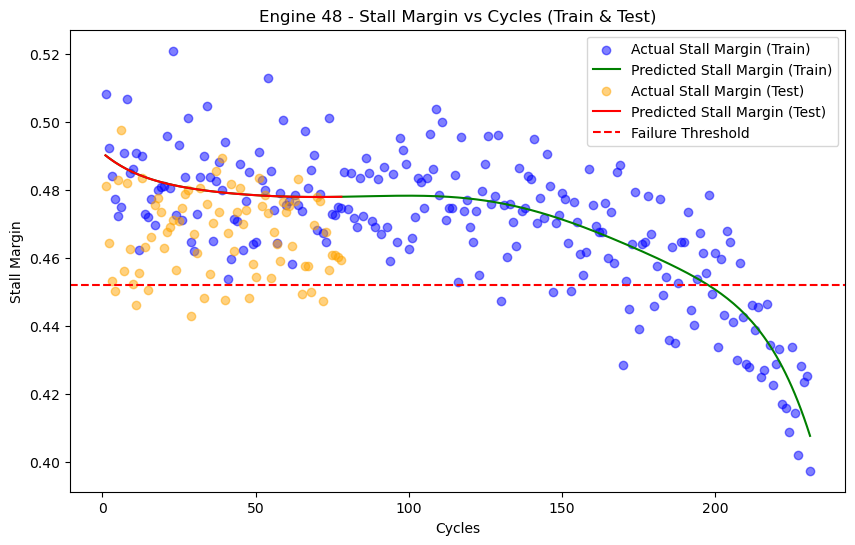

Engine 48 - R2 score (Train): 0.6459583266175819
Training: Stall margin breaches the threshold at cycle 205, predicted value 0.4472604551101269


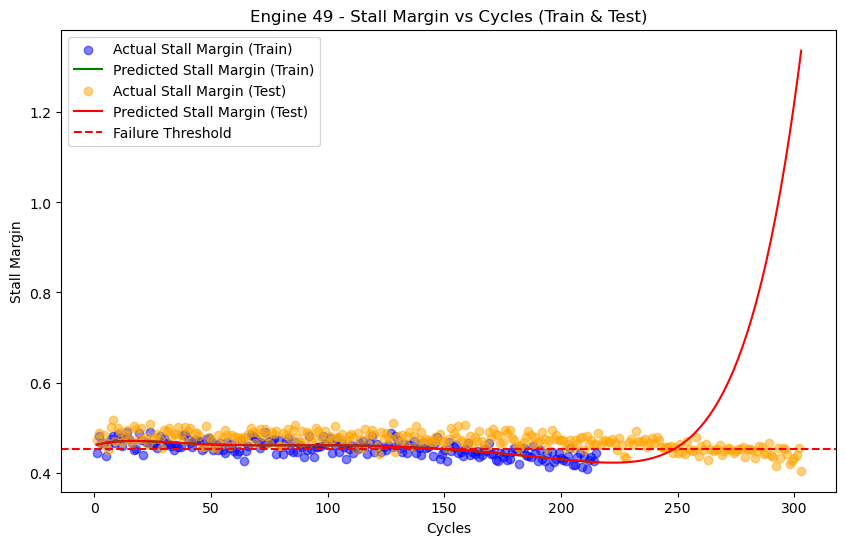

Engine 49 - R2 score (Train): 0.43413268090157286
Training: Stall margin breaches the threshold at cycle 163, predicted value 0.44748424758201644
Test: Stall margin breaches the threshold at cycle 151, predicted value 0.4519667403865437


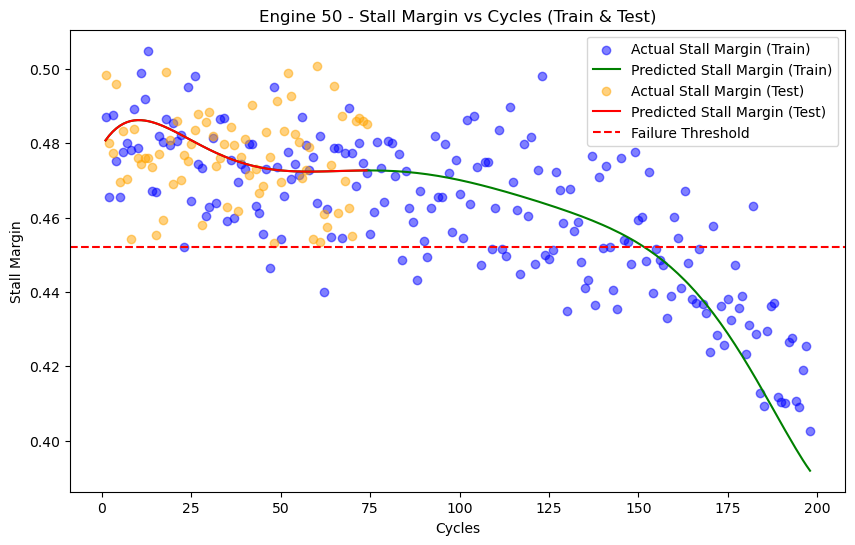

Engine 50 - R2 score (Train): 0.5677493445981666
Training: Stall margin breaches the threshold at cycle 159, predicted value 0.4467019307086232


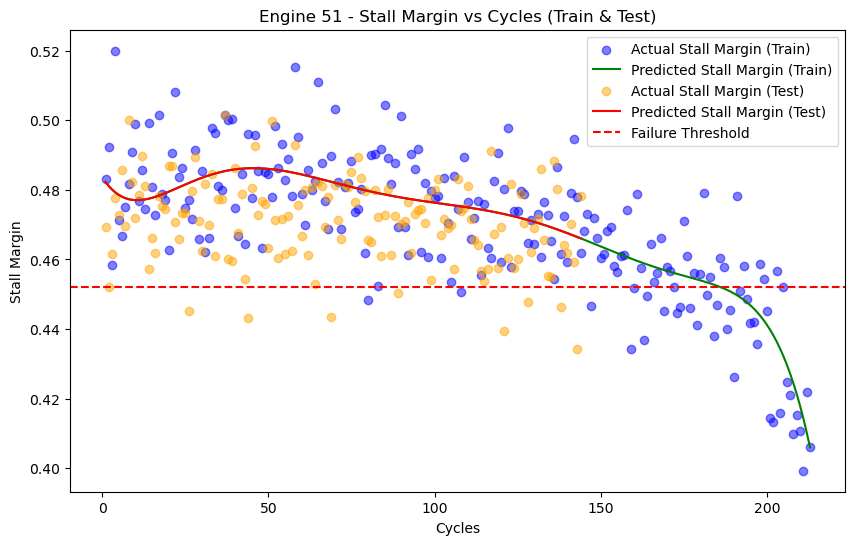

Engine 51 - R2 score (Train): 0.6429165312136418
Training: Stall margin breaches the threshold at cycle 195, predicted value 0.44685649441109915


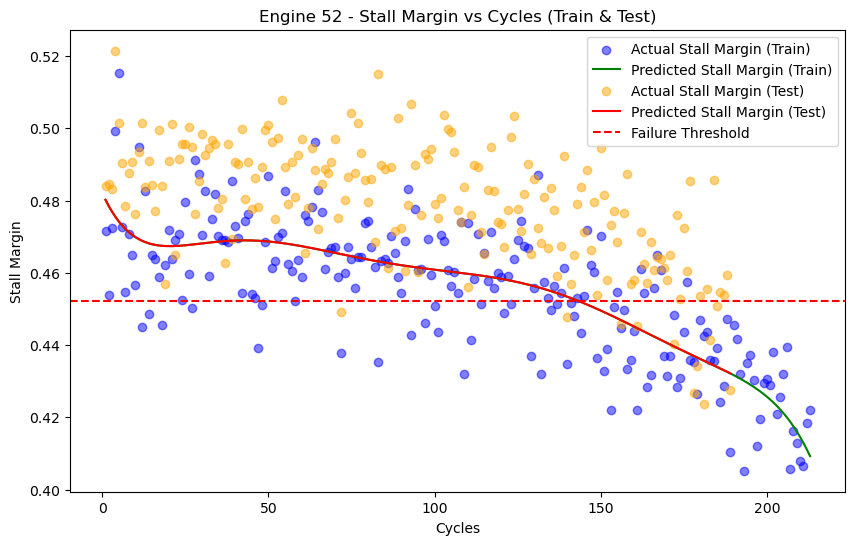

Engine 52 - R2 score (Train): 0.5967545228670263
Training: Stall margin breaches the threshold at cycle 155, predicted value 0.4474093634203064
Test: Stall margin breaches the threshold at cycle 144, predicted value 0.4519478175356972


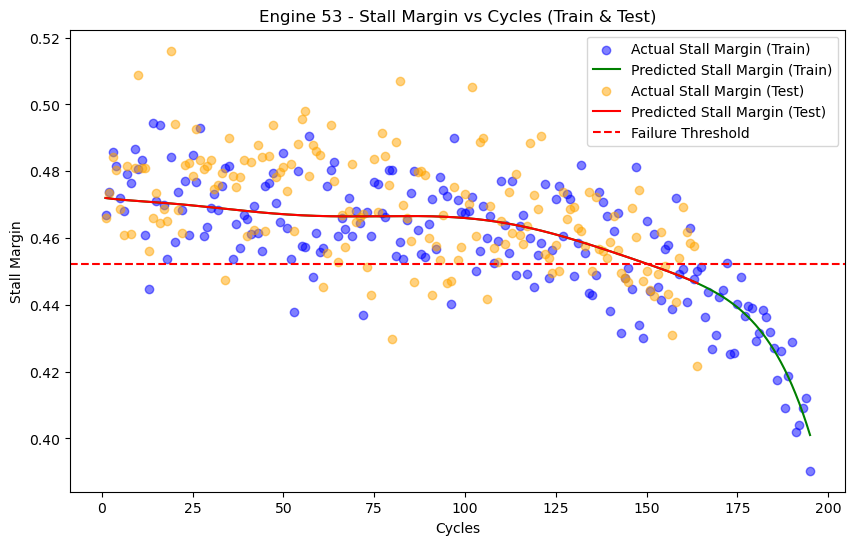

Engine 53 - R2 score (Train): 0.6470679687980576
Training: Stall margin breaches the threshold at cycle 162, predicted value 0.4474196997403132
Test: Stall margin breaches the threshold at cycle 151, predicted value 0.45194536120881906


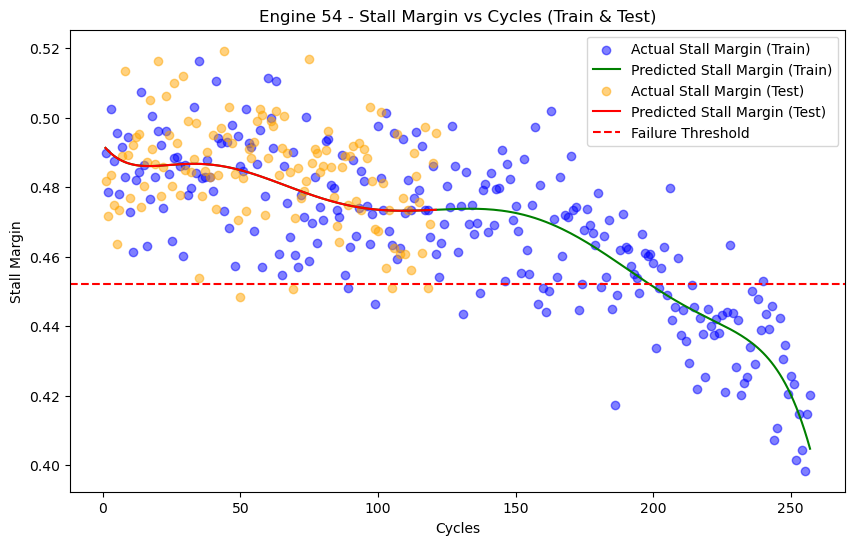

Engine 54 - R2 score (Train): 0.6672270261323207
Training: Stall margin breaches the threshold at cycle 208, predicted value 0.44742947638932373


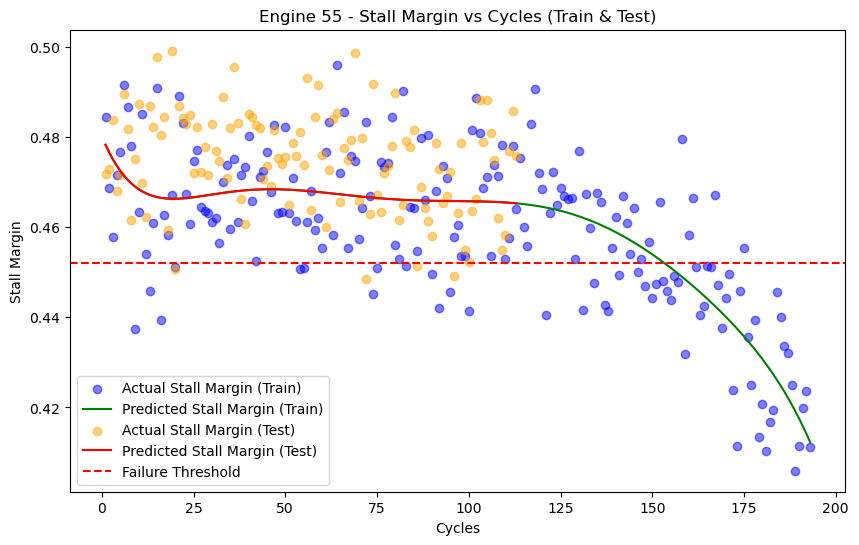

Engine 55 - R2 score (Train): 0.5500766884668582
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.44703393425093235


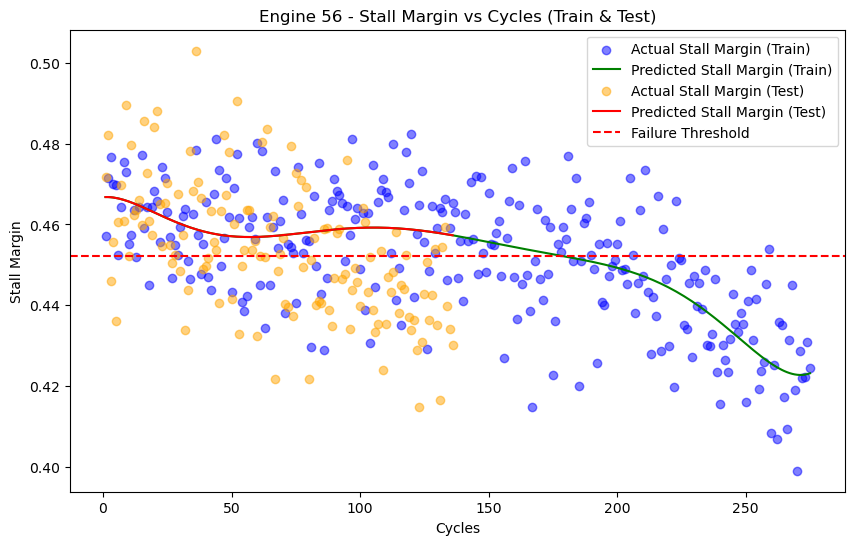

Engine 56 - R2 score (Train): 0.4377382620945428
Training: Stall margin breaches the threshold at cycle 209, predicted value 0.44747213988043083


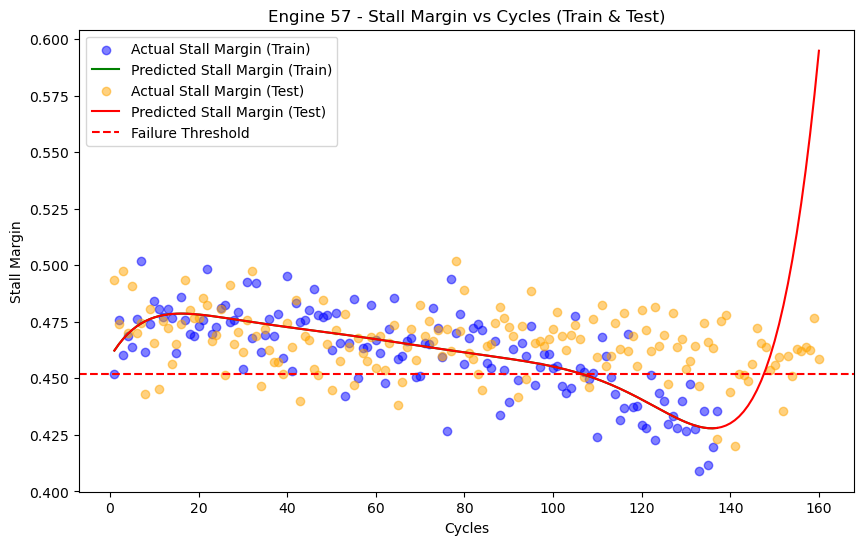

Engine 57 - R2 score (Train): 0.6106436529993748
Training: Stall margin breaches the threshold at cycle 113, predicted value 0.44725582448867884
Test: Stall margin breaches the threshold at cycle 107, predicted value 0.4516059502783212


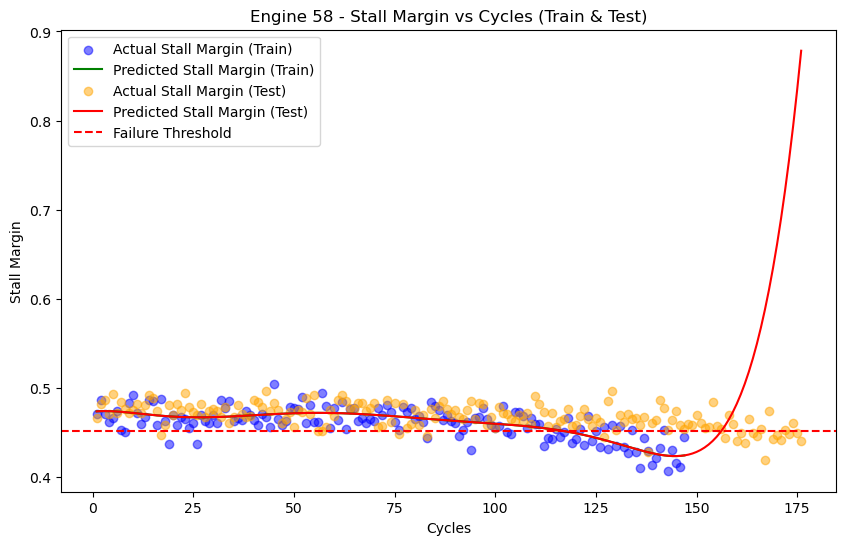

Engine 58 - R2 score (Train): 0.5444664842524198
Training: Stall margin breaches the threshold at cycle 123, predicted value 0.44655785118941327
Test: Stall margin breaches the threshold at cycle 117, predicted value 0.45197755438987275


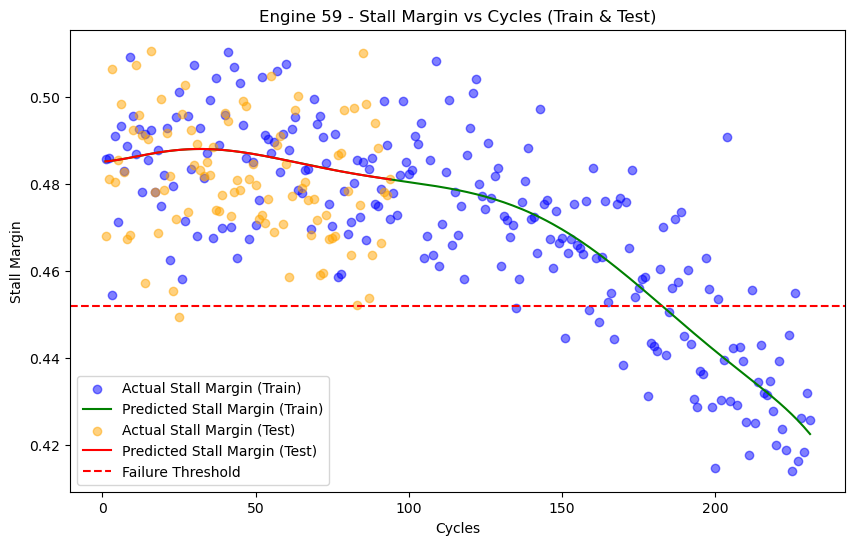

Engine 59 - R2 score (Train): 0.6783008779117337
Training: Stall margin breaches the threshold at cycle 191, predicted value 0.4469782408435488


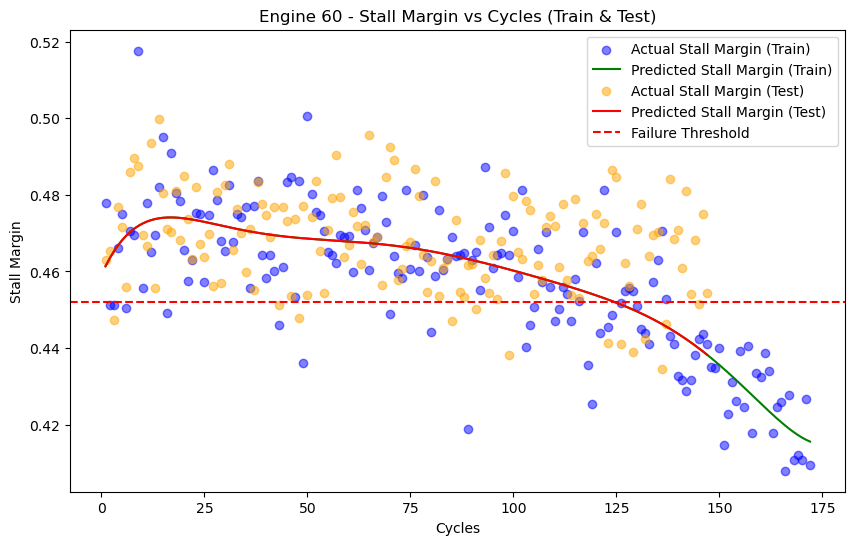

Engine 60 - R2 score (Train): 0.6404053115077709
Training: Stall margin breaches the threshold at cycle 134, predicted value 0.4474523629383664
Test: Stall margin breaches the threshold at cycle 125, predicted value 0.4518127612160067


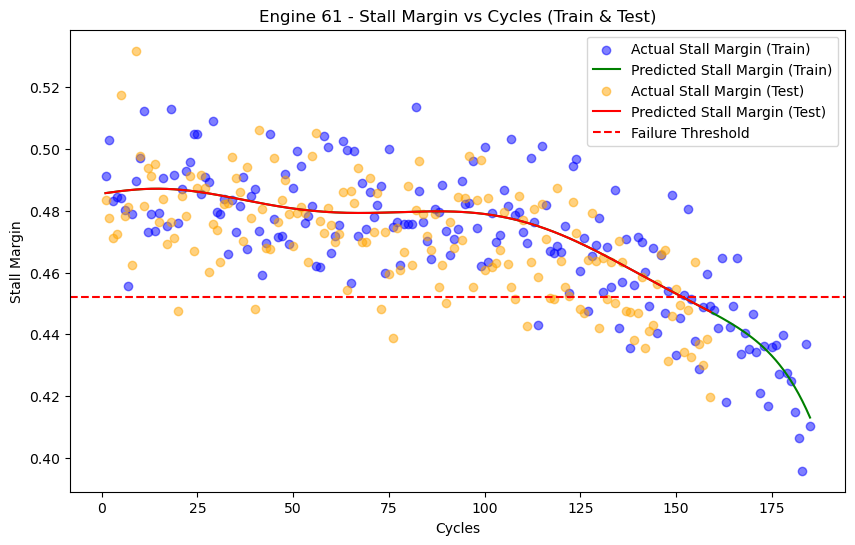

Engine 61 - R2 score (Train): 0.6618424698696252
Training: Stall margin breaches the threshold at cycle 159, predicted value 0.4472780275532548
Test: Stall margin breaches the threshold at cycle 152, predicted value 0.4518374625036065


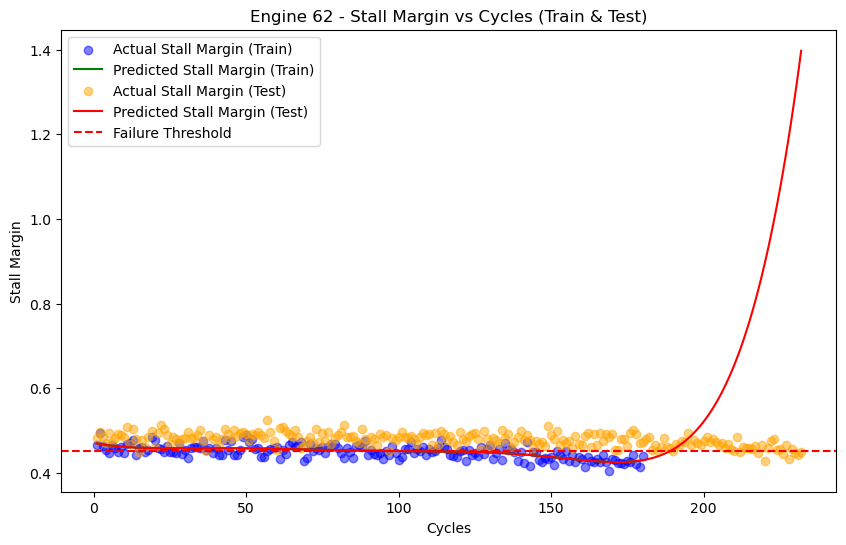

Engine 62 - R2 score (Train): 0.4264750889332788
Training: Stall margin breaches the threshold at cycle 133, predicted value 0.44724384474518414
Test: Stall margin breaches the threshold at cycle 95, predicted value 0.452019319524492


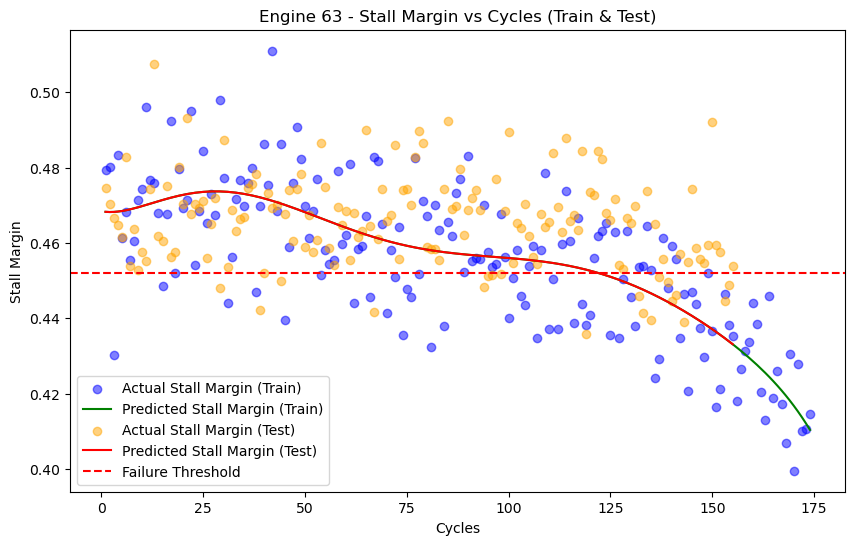

Engine 63 - R2 score (Train): 0.5720956179919179
Training: Stall margin breaches the threshold at cycle 134, predicted value 0.44711318924731386
Test: Stall margin breaches the threshold at cycle 122, predicted value 0.4520316429965831


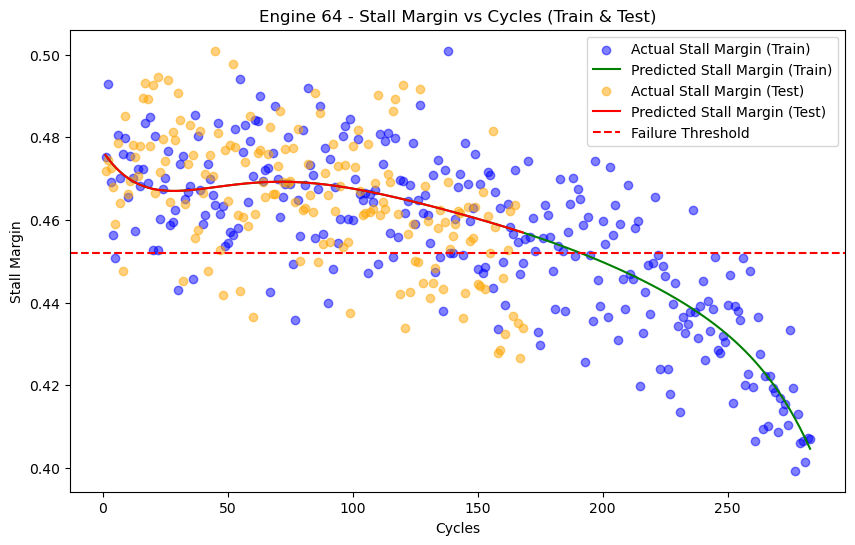

Engine 64 - R2 score (Train): 0.6594057247889128
Training: Stall margin breaches the threshold at cycle 209, predicted value 0.4474075320350201


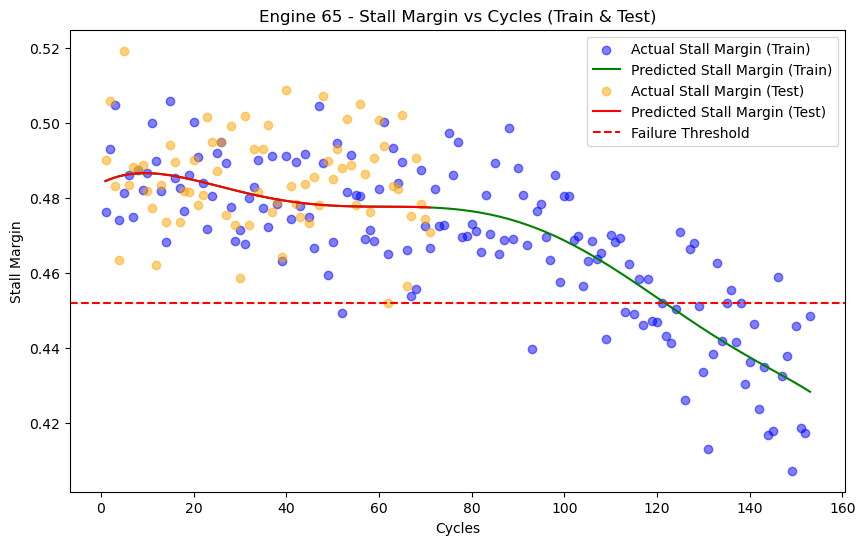

Engine 65 - R2 score (Train): 0.6633678489462369
Training: Stall margin breaches the threshold at cycle 127, predicted value 0.4475115943344636


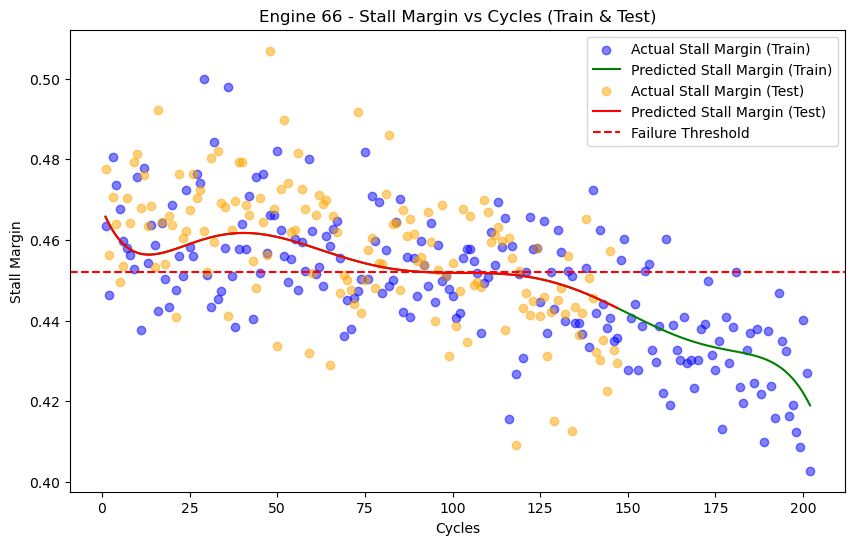

Engine 66 - R2 score (Train): 0.4982829432955854
Training: Stall margin breaches the threshold at cycle 136, predicted value 0.4474080163329453
Test: Stall margin breaches the threshold at cycle 91, predicted value 0.4520776479314626


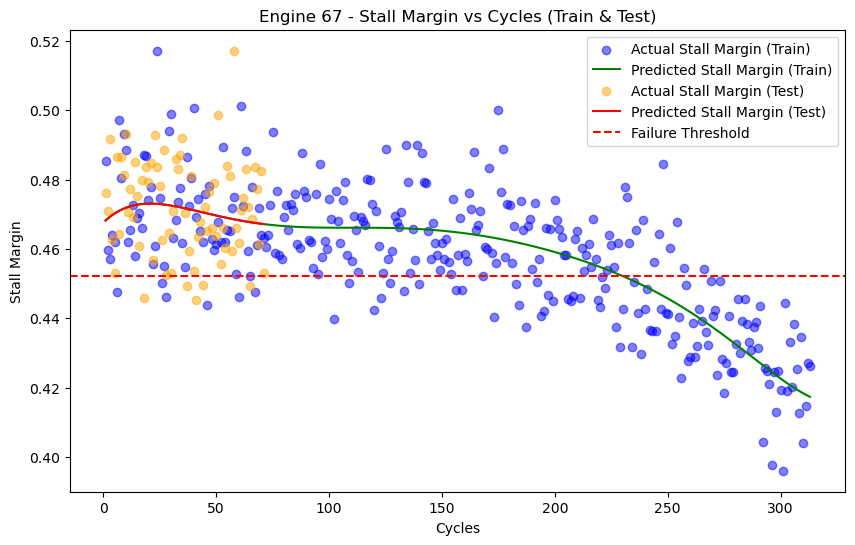

Engine 67 - R2 score (Train): 0.569320500336528
Training: Stall margin breaches the threshold at cycle 245, predicted value 0.44750964820548944


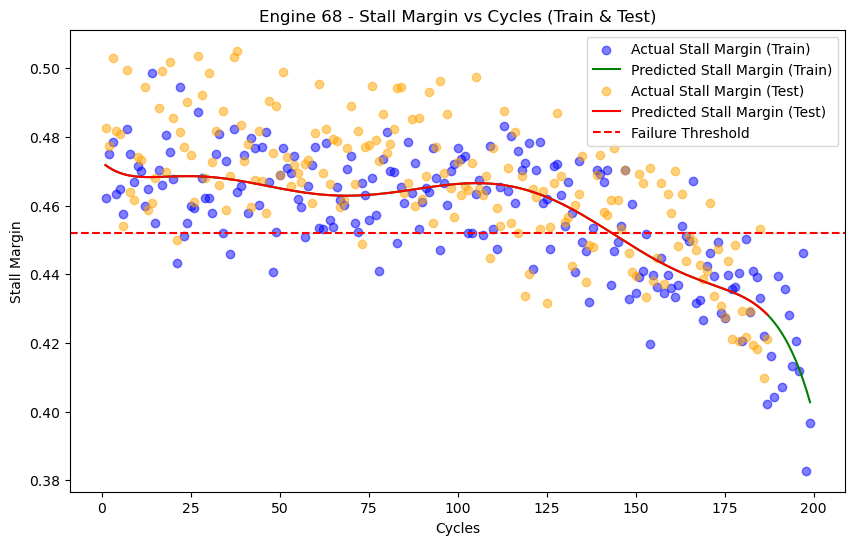

Engine 68 - R2 score (Train): 0.6312956929638136
Training: Stall margin breaches the threshold at cycle 151, predicted value 0.4469979278598521
Test: Stall margin breaches the threshold at cycle 144, predicted value 0.4515447734244708


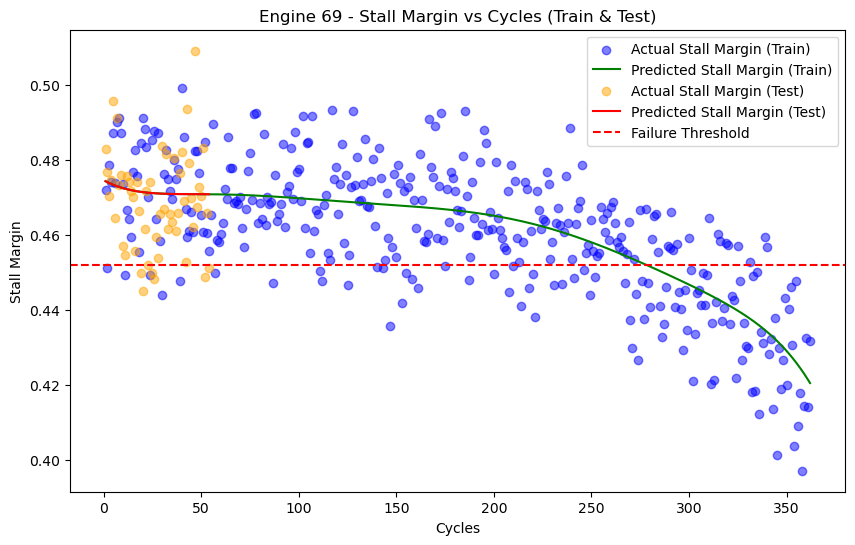

Engine 69 - R2 score (Train): 0.5486241138657202
Training: Stall margin breaches the threshold at cycle 298, predicted value 0.4473603504711601


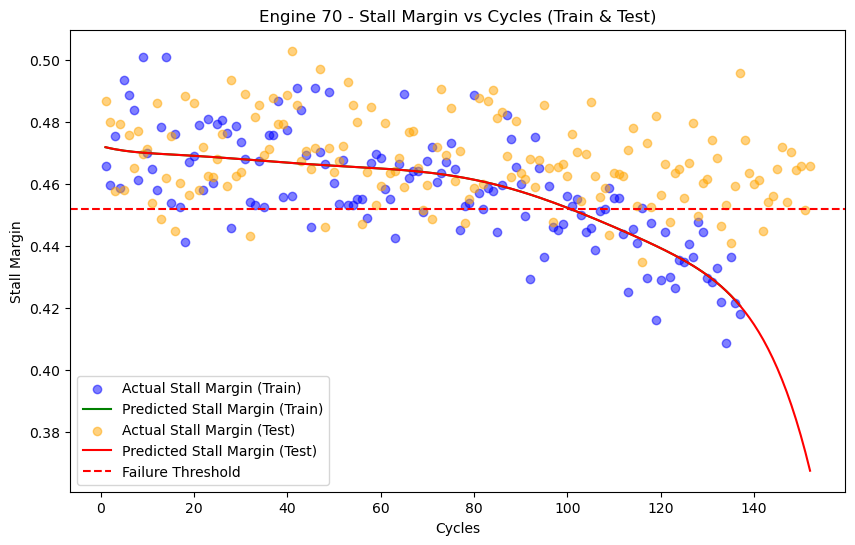

Engine 70 - R2 score (Train): 0.5481301296061689
Training: Stall margin breaches the threshold at cycle 108, predicted value 0.4474346954845235
Test: Stall margin breaches the threshold at cycle 101, predicted value 0.4517568666957662


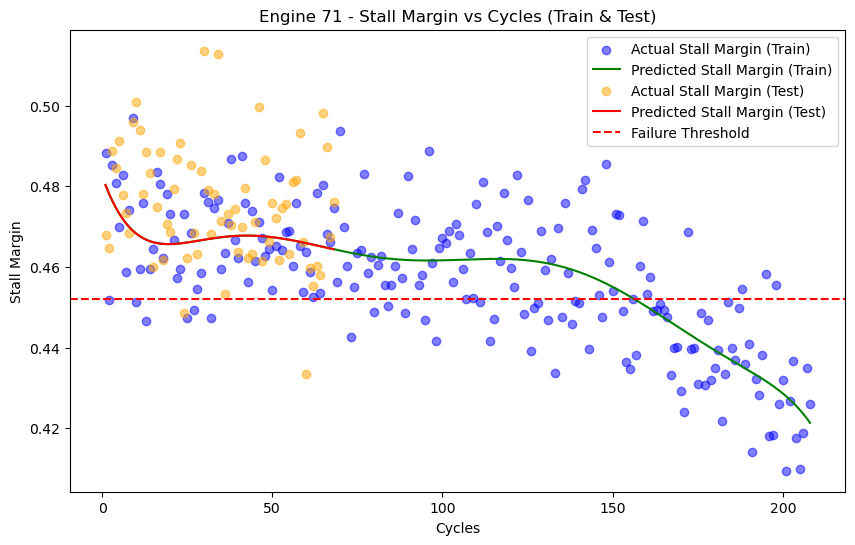

Engine 71 - R2 score (Train): 0.5248422349849388
Training: Stall margin breaches the threshold at cycle 165, predicted value 0.44741780001377995


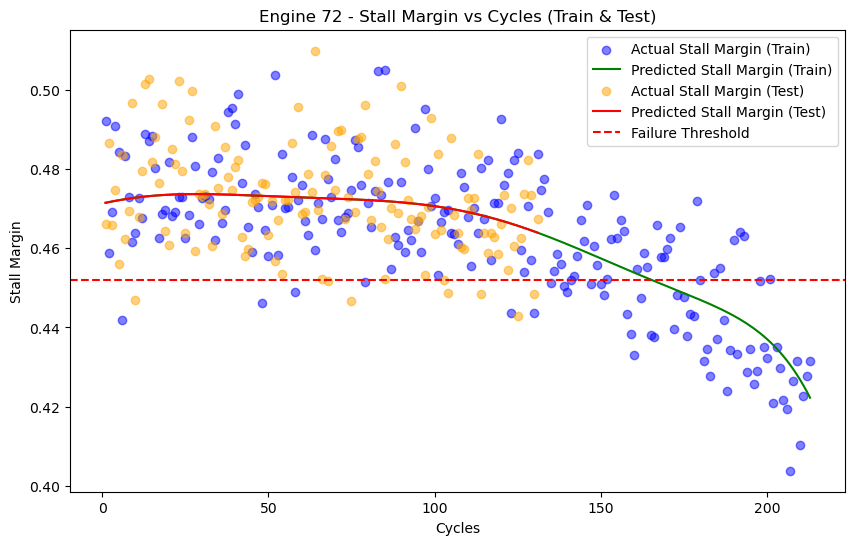

Engine 72 - R2 score (Train): 0.5886217908449576
Training: Stall margin breaches the threshold at cycle 179, predicted value 0.4473037187847271


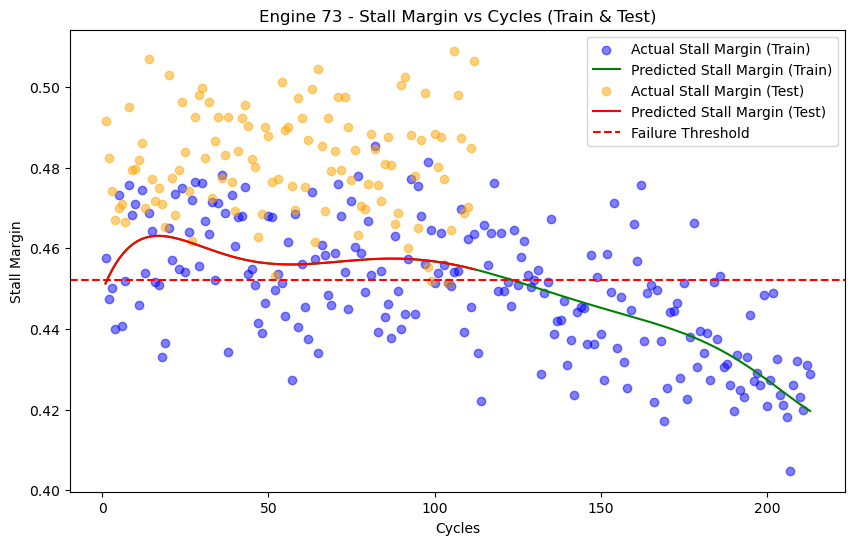

Engine 73 - R2 score (Train): 0.41461860719043175
Training: Stall margin breaches the threshold at cycle 141, predicted value 0.4475091495814387
Test: Stall margin breaches the threshold at cycle 1, predicted value 0.4512911787679449


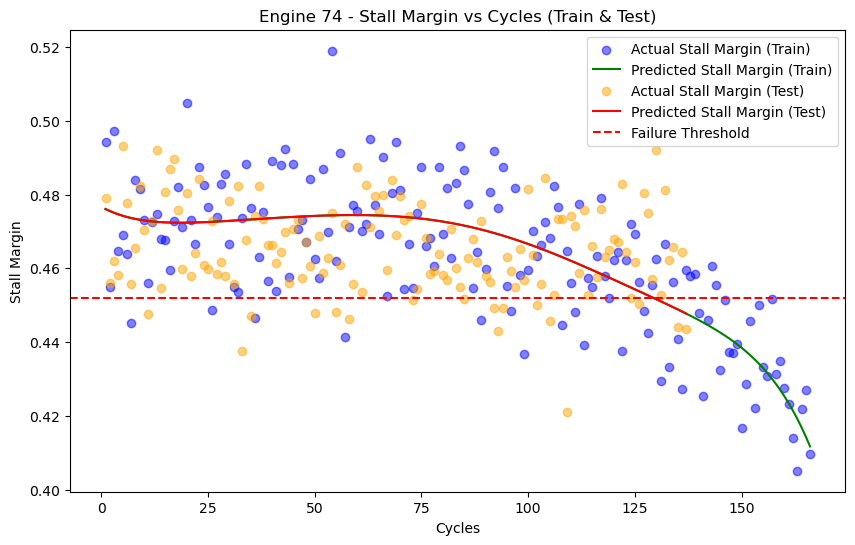

Engine 74 - R2 score (Train): 0.5539176179972295
Training: Stall margin breaches the threshold at cycle 138, predicted value 0.44714151979482414
Test: Stall margin breaches the threshold at cycle 130, predicted value 0.45162489403796063


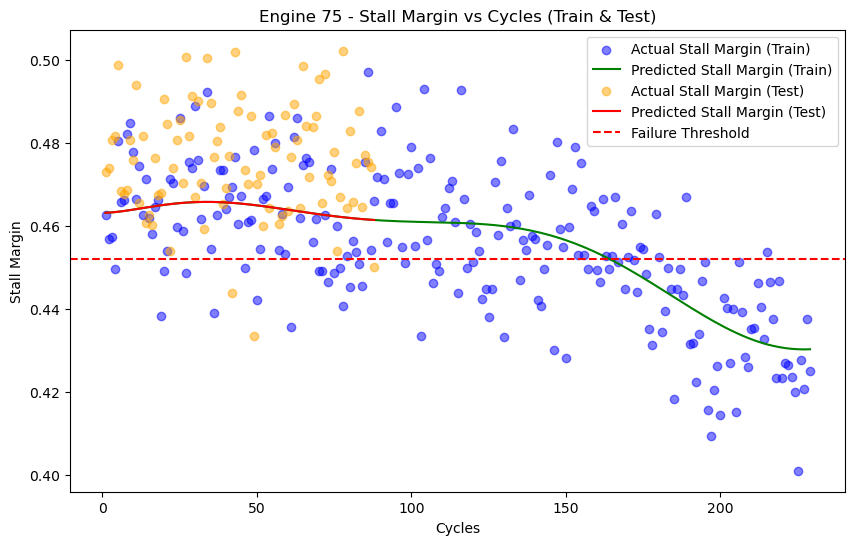

Engine 75 - R2 score (Train): 0.4632181819916008
Training: Stall margin breaches the threshold at cycle 176, predicted value 0.4471103880830374


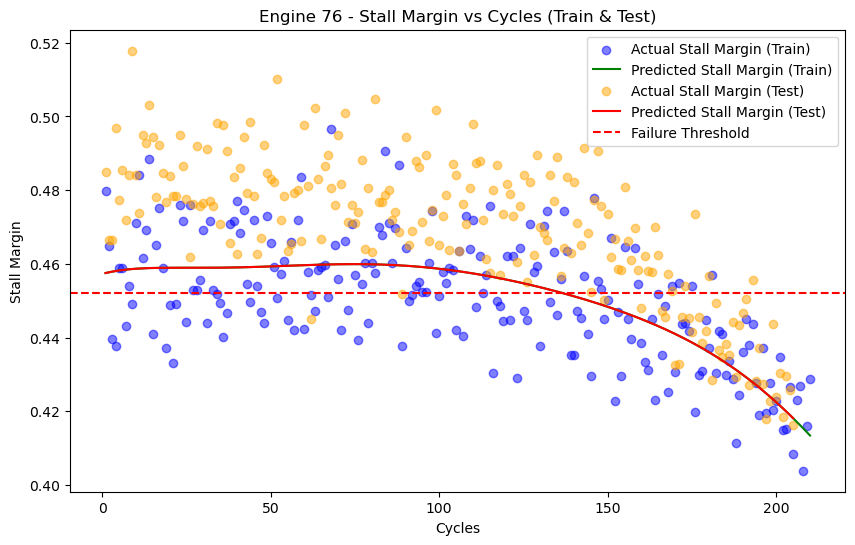

Engine 76 - R2 score (Train): 0.4523568203553304
Training: Stall margin breaches the threshold at cycle 153, predicted value 0.44742491133432066
Test: Stall margin breaches the threshold at cycle 137, predicted value 0.451989196612641


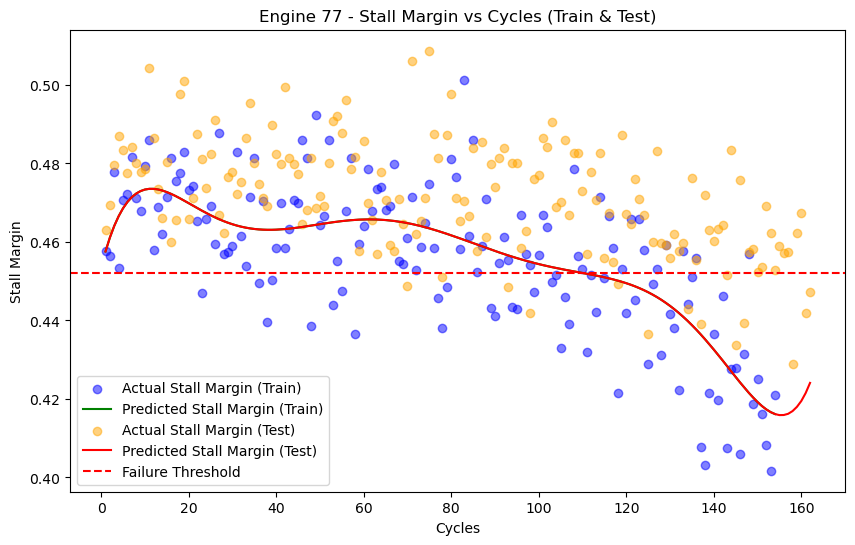

Engine 77 - R2 score (Train): 0.5410769946864575
Training: Stall margin breaches the threshold at cycle 125, predicted value 0.44718523597698595
Test: Stall margin breaches the threshold at cycle 110, predicted value 0.45208938693981554


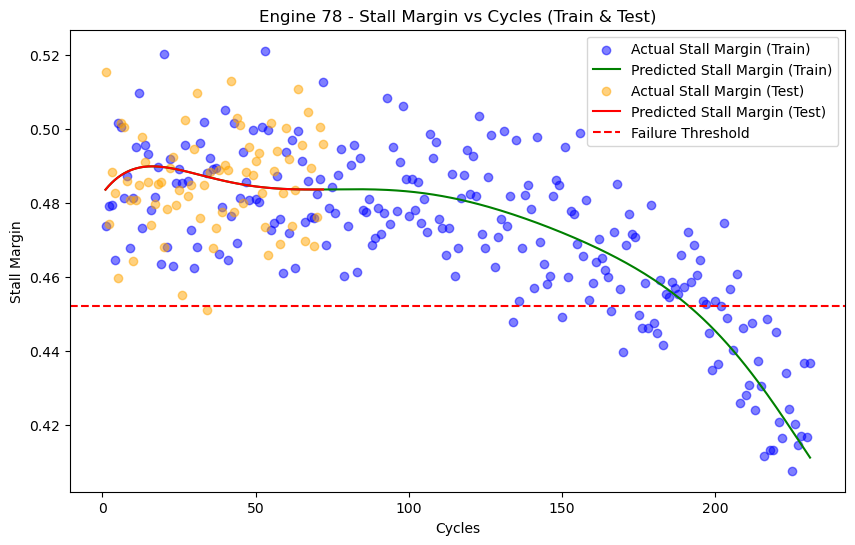

Engine 78 - R2 score (Train): 0.650745962902167
Training: Stall margin breaches the threshold at cycle 198, predicted value 0.4470799443010548


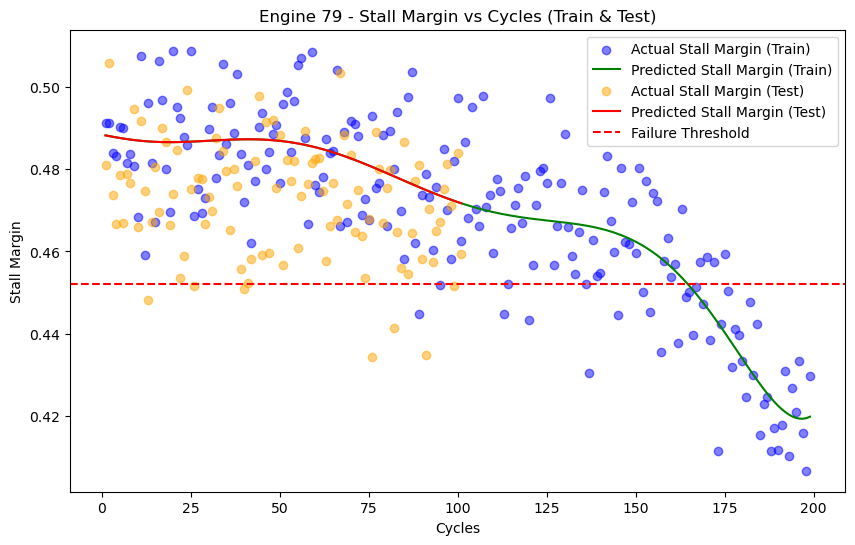

Engine 79 - R2 score (Train): 0.7041056532694241
Training: Stall margin breaches the threshold at cycle 170, predicted value 0.4463867180765454


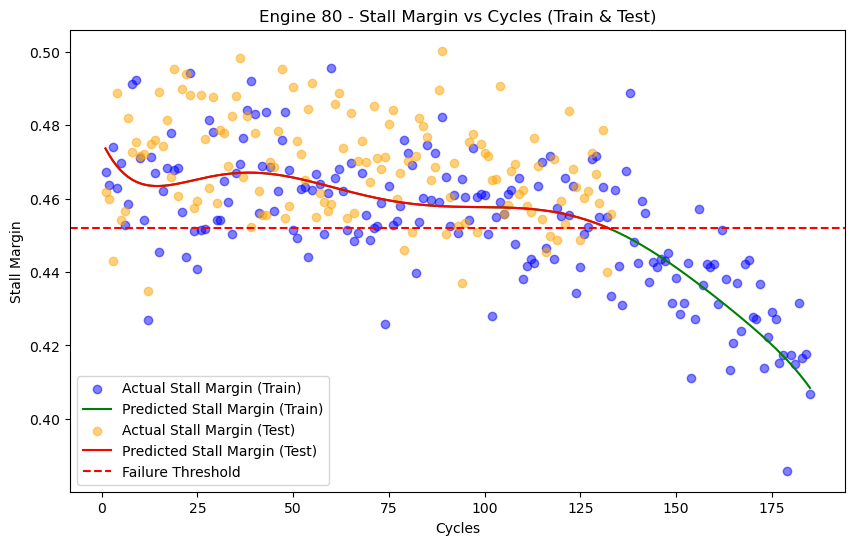

Engine 80 - R2 score (Train): 0.5497075211951603
Training: Stall margin breaches the threshold at cycle 141, predicted value 0.4473440394667295
Test: Stall margin breaches the threshold at cycle 133, predicted value 0.4516530641285089


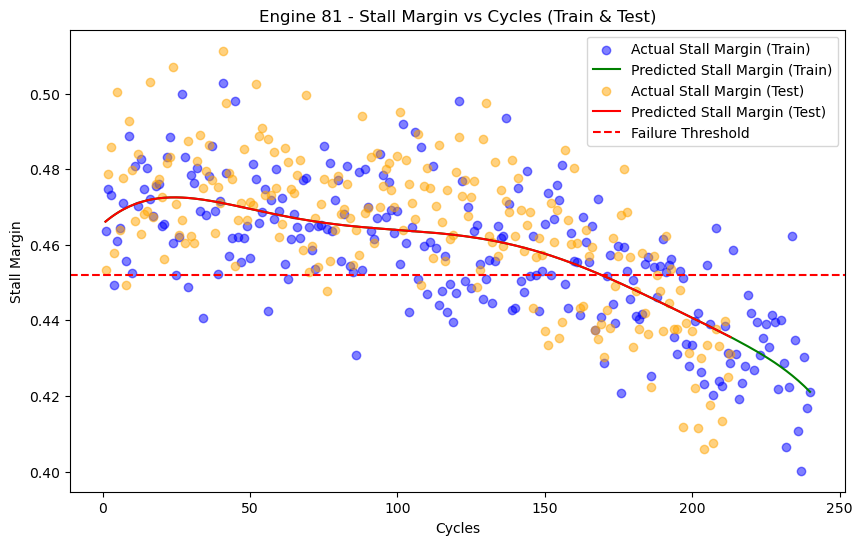

Engine 81 - R2 score (Train): 0.5235618128132088
Training: Stall margin breaches the threshold at cycle 182, predicted value 0.44747125950473526
Test: Stall margin breaches the threshold at cycle 169, predicted value 0.4520684465469716


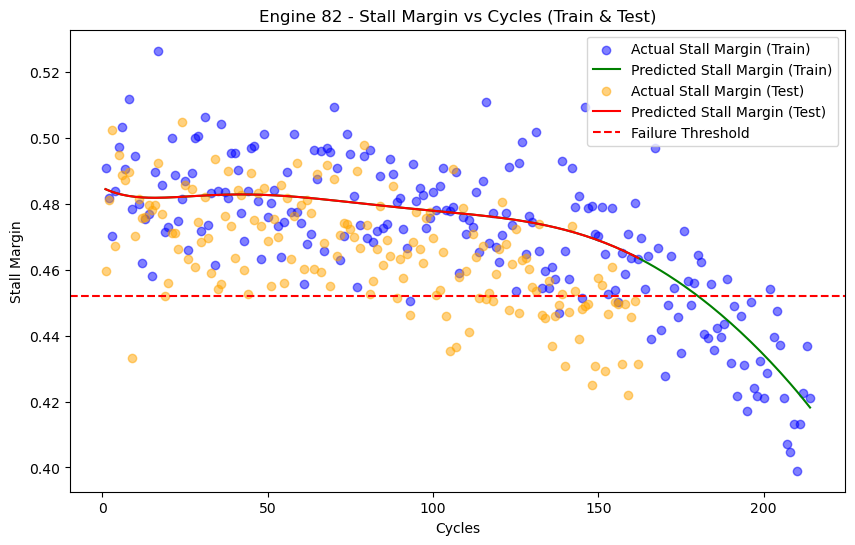

Engine 82 - R2 score (Train): 0.6421090698734273
Training: Stall margin breaches the threshold at cycle 186, predicted value 0.44729381737543633


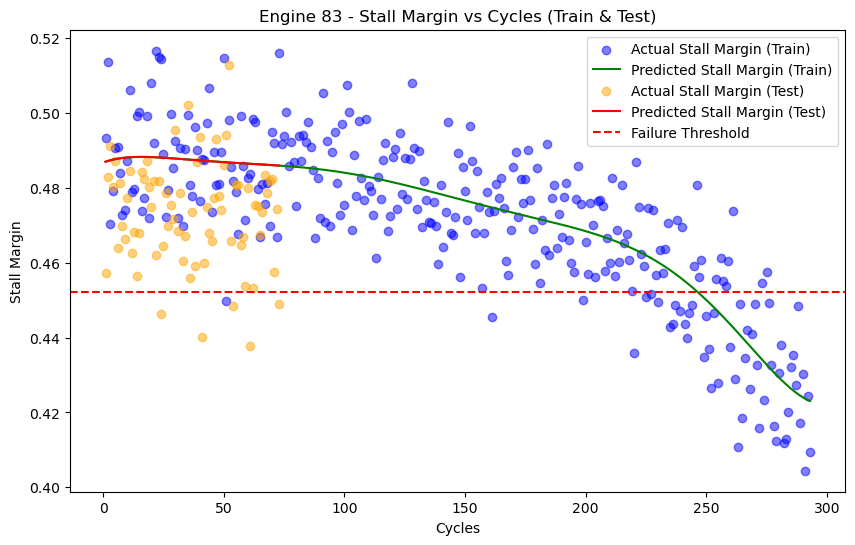

Engine 83 - R2 score (Train): 0.6910654253865928
Training: Stall margin breaches the threshold at cycle 255, predicted value 0.44688915045624295


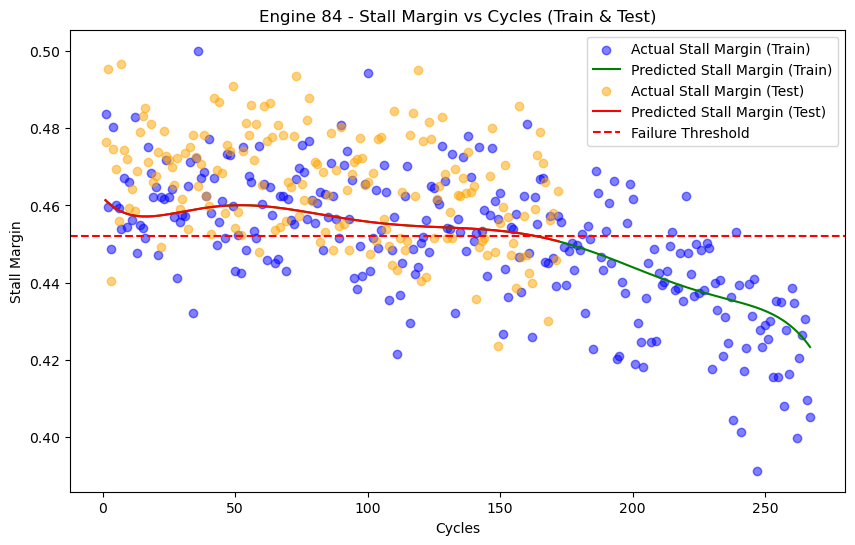

Engine 84 - R2 score (Train): 0.46006234323858175
Training: Stall margin breaches the threshold at cycle 187, predicted value 0.44746856826111514
Test: Stall margin breaches the threshold at cycle 164, predicted value 0.4520087732629462


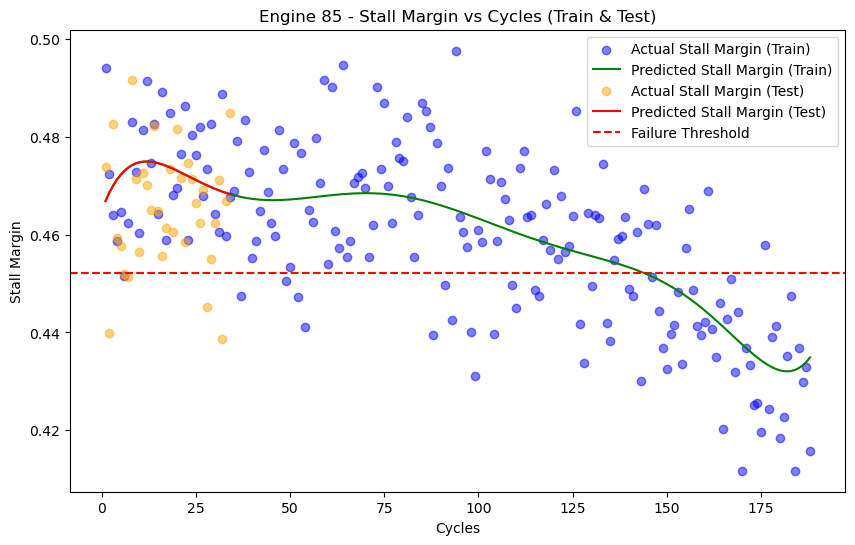

Engine 85 - R2 score (Train): 0.5229998466247643
Training: Stall margin breaches the threshold at cycle 155, predicted value 0.4474756776962411


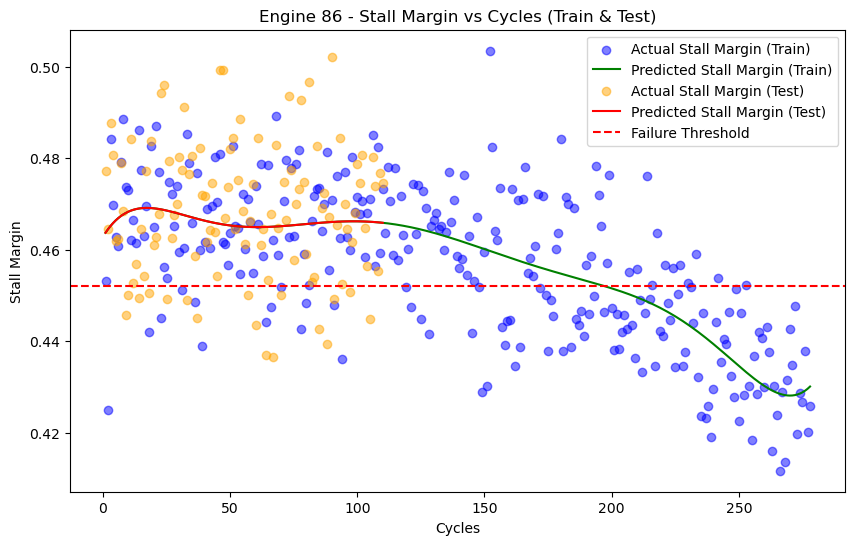

Engine 86 - R2 score (Train): 0.4922673751020452
Training: Stall margin breaches the threshold at cycle 219, predicted value 0.4473387584212866


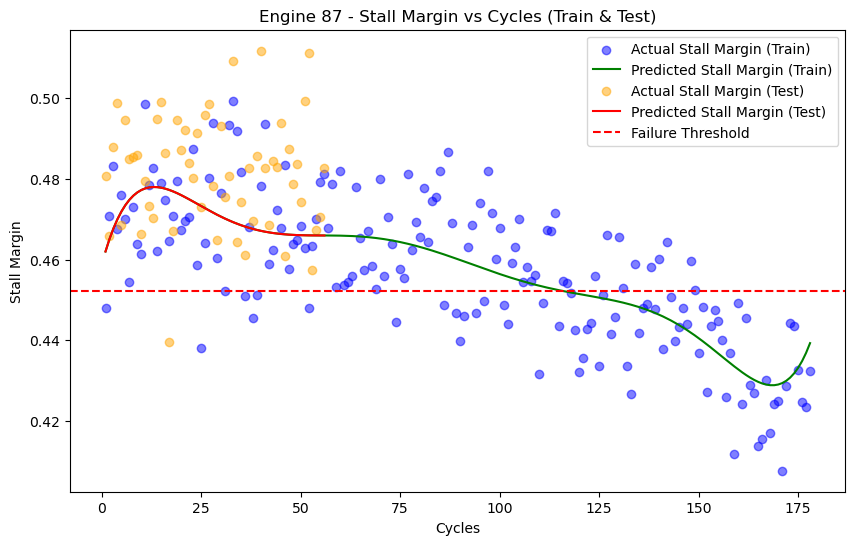

Engine 87 - R2 score (Train): 0.5626582978071872
Training: Stall margin breaches the threshold at cycle 138, predicted value 0.4471967103217788


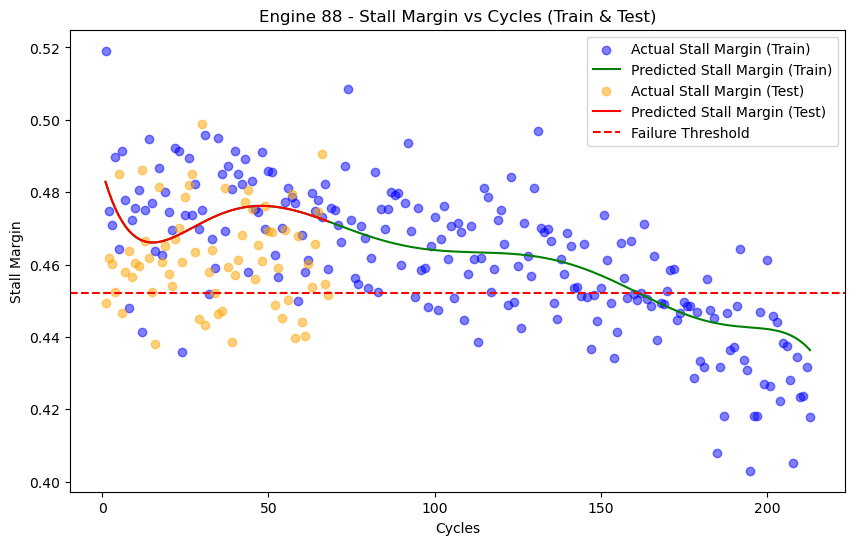

Engine 88 - R2 score (Train): 0.5355603929538766
Training: Stall margin breaches the threshold at cycle 173, predicted value 0.4471491927234448


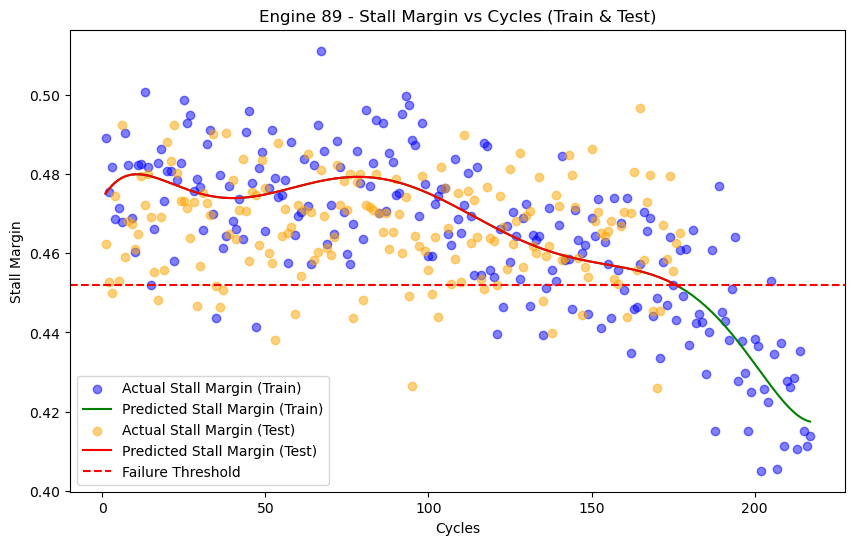

Engine 89 - R2 score (Train): 0.6452599762636069
Training: Stall margin breaches the threshold at cycle 184, predicted value 0.4473300438372143
Test: Stall margin breaches the threshold at cycle 176, predicted value 0.45192864648976405


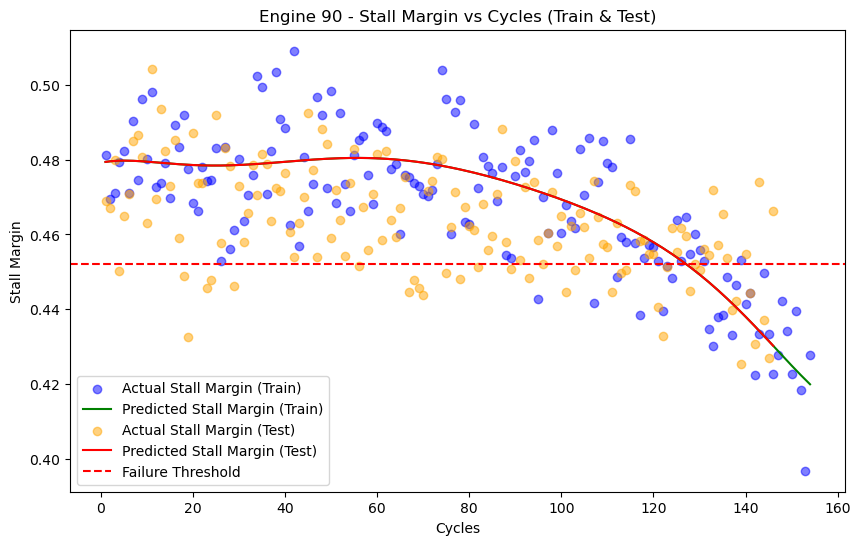

Engine 90 - R2 score (Train): 0.6483945460958175
Training: Stall margin breaches the threshold at cycle 132, predicted value 0.4472747982678434
Test: Stall margin breaches the threshold at cycle 128, predicted value 0.45124315630769934


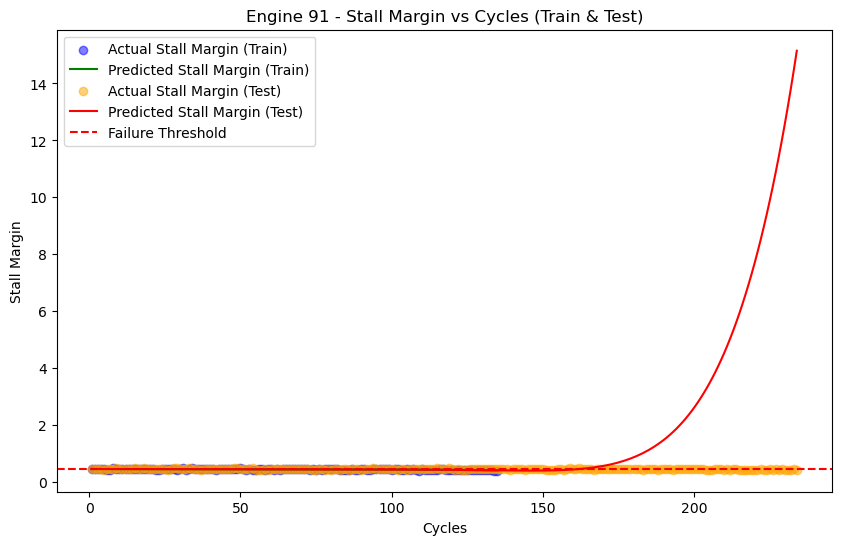

Engine 91 - R2 score (Train): 0.44049471032865206
Training: Stall margin breaches the threshold at cycle 73, predicted value 0.4474102091664512
Test: Stall margin breaches the threshold at cycle 59, predicted value 0.4519939367348392


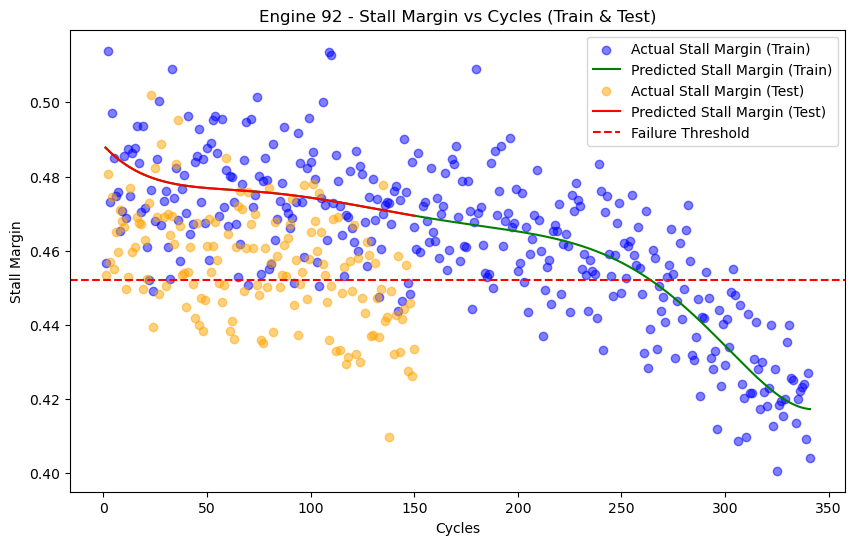

Engine 92 - R2 score (Train): 0.6308028190319253
Training: Stall margin breaches the threshold at cycle 275, predicted value 0.44747860233789394


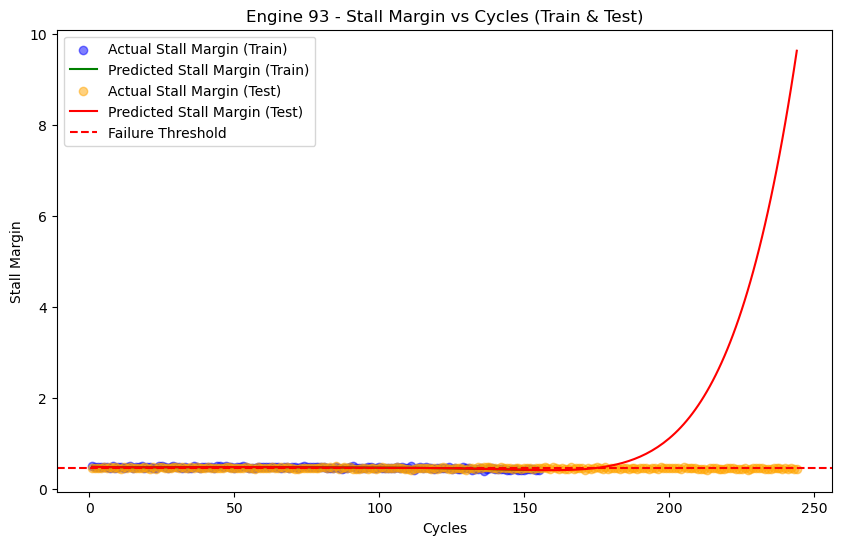

Engine 93 - R2 score (Train): 0.6261116286120929
Training: Stall margin breaches the threshold at cycle 131, predicted value 0.44684538484463365
Test: Stall margin breaches the threshold at cycle 127, predicted value 0.4514928782070604


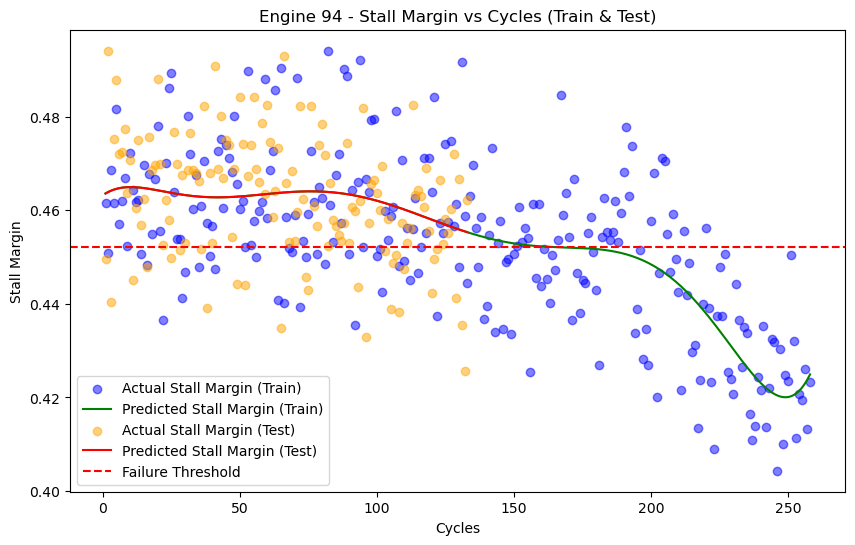

Engine 94 - R2 score (Train): 0.48763419119740137
Training: Stall margin breaches the threshold at cycle 203, predicted value 0.44738874310481497


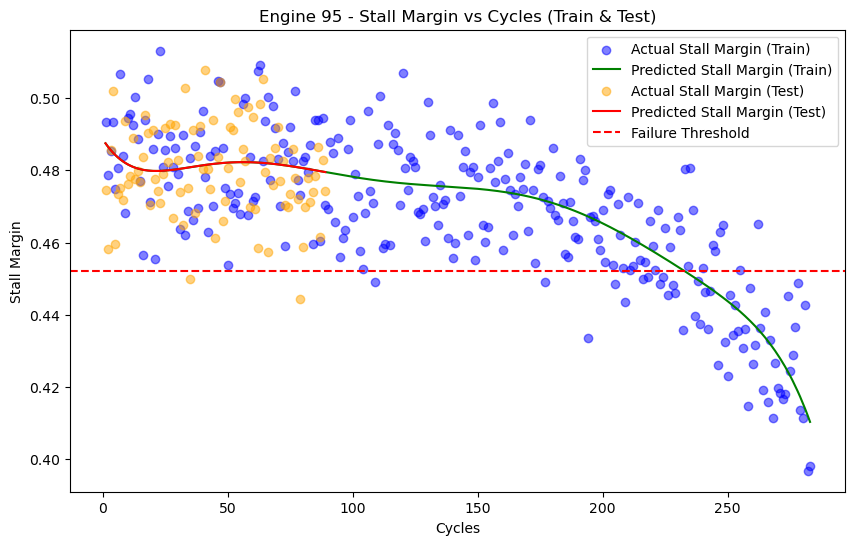

Engine 95 - R2 score (Train): 0.6413173703559469
Training: Stall margin breaches the threshold at cycle 243, predicted value 0.44734069485380623


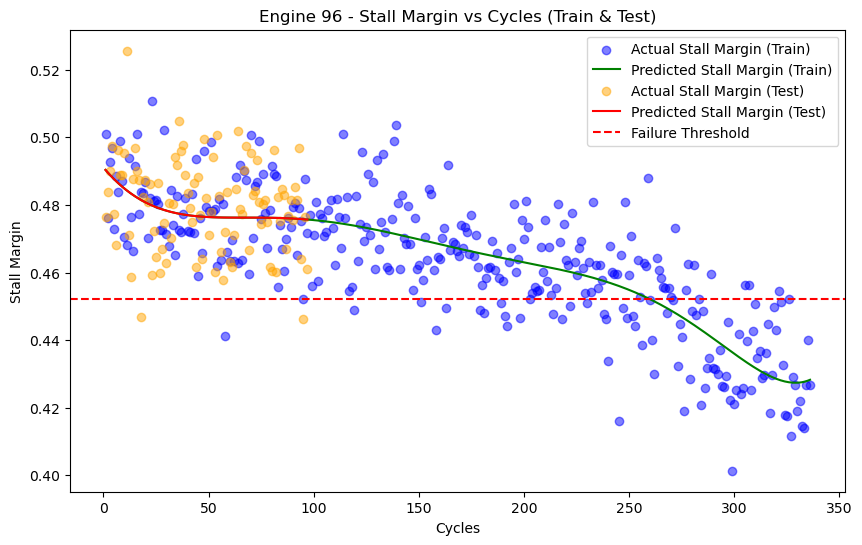

Engine 96 - R2 score (Train): 0.6289060879808253
Training: Stall margin breaches the threshold at cycle 274, predicted value 0.44723038306997087


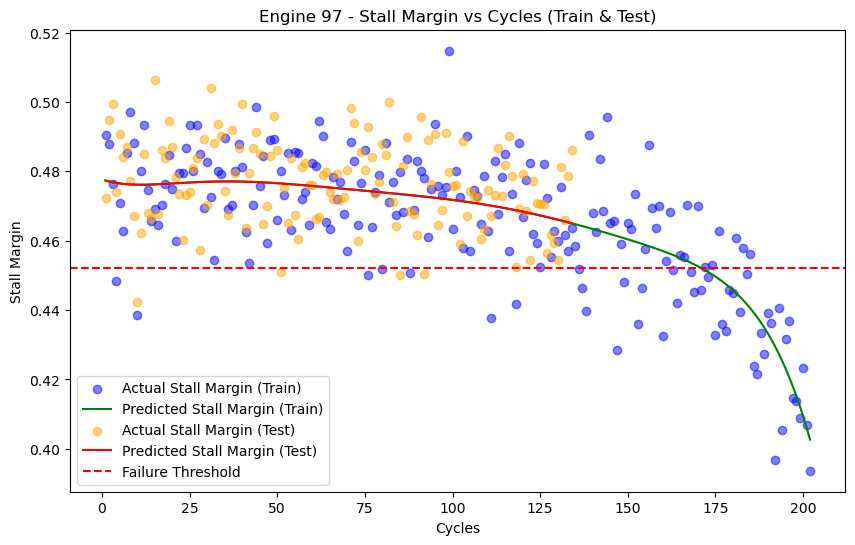

Engine 97 - R2 score (Train): 0.6025772579460162
Training: Stall margin breaches the threshold at cycle 178, predicted value 0.4474538631622974


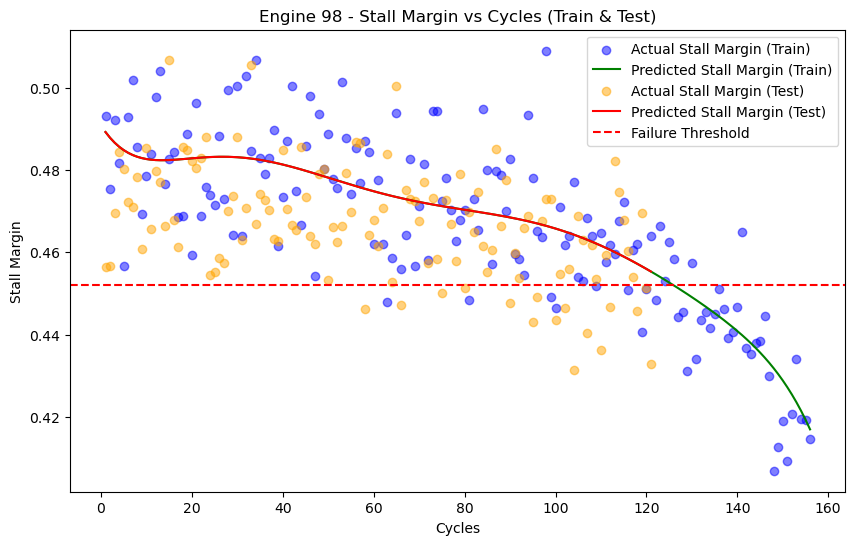

Engine 98 - R2 score (Train): 0.6683501785918846
Training: Stall margin breaches the threshold at cycle 133, predicted value 0.4468102800100094


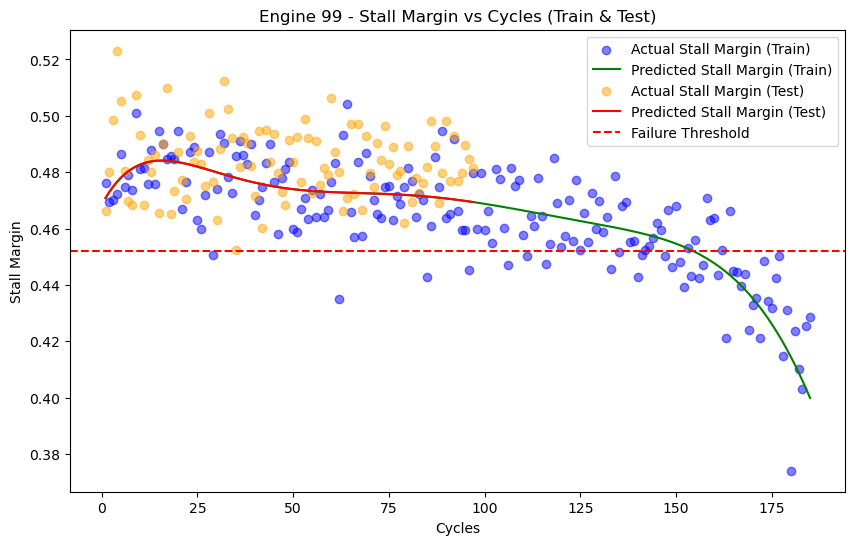

Engine 99 - R2 score (Train): 0.6237059014346327
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.44675016941698686


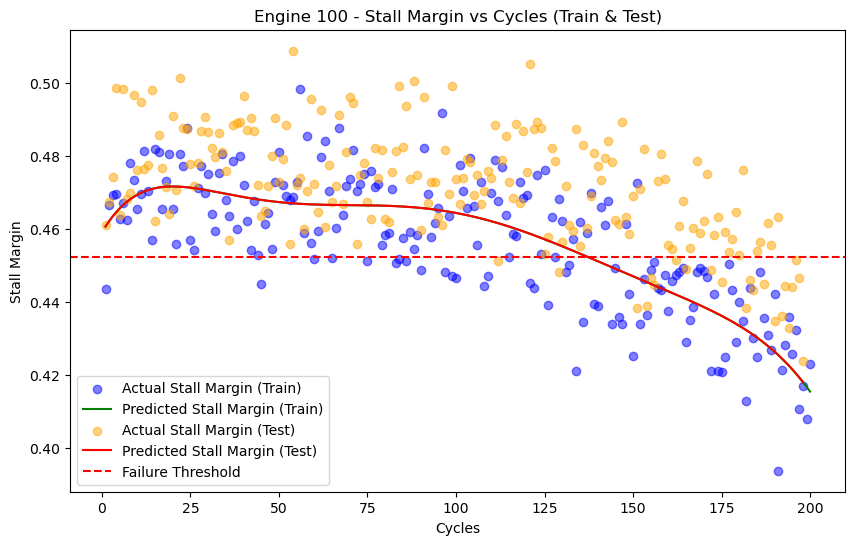

Engine 100 - R2 score (Train): 0.6136249508558143
Training: Stall margin breaches the threshold at cycle 149, predicted value 0.447350601977174
Test: Stall margin breaches the threshold at cycle 138, predicted value 0.451905235028331


In [27]:
# Loop through each engine and fit a model
for engine in unique_engines:
    # Filter data for the current engine in both training and test sets
    engine_train_data = FD001_data_training[FD001_data_training['Engine'] == engine]
    engine_test_data = FD001_data_test[FD001_data_test['Engine'] == engine]

    # Defining training split features
    X_train = engine_train_data[['Cycles', 'Baseline_Efficiency', 'Initial_Wear_HPT_Efficiency', 'Initial_Wear_HPT_Flow',
                                 'Wear_HPT_Efficiency_3000', 'Wear_HPT_Flow_3000', 'Wear_HPT_Efficiency_6000', 'Wear_HPT_Flow_6000', 'Engine pressure ratioP50/P2']]
    y_train = engine_train_data['stall_margin']

    # Defining test split features
    X_test = engine_test_data[['Cycles', 'Baseline_Efficiency', 'Initial_Wear_HPT_Efficiency', 'Initial_Wear_HPT_Flow',
                               'Wear_HPT_Efficiency_3000', 'Wear_HPT_Flow_3000', 'Wear_HPT_Efficiency_6000', 'Wear_HPT_Flow_6000', 'Engine pressure ratioP50/P2']]
    y_test = engine_test_data['stall_margin']

    # Polynomial model pipeline
    poly_pipe = Pipeline([('poly', PolynomialFeatures(degree=7)), ('lin', LinearRegression())])
    poly_pipe.fit(X_train, y_train)

    # Predict for training and test data
    y_train_pred = poly_pipe.predict(X_train)
    y_test_pred = poly_pipe.predict(X_test)

    r2_poly_train = r2_score(y_train, y_train_pred)
    r2_scores_data.append(r2_poly_train)

    # Store the model and data
    engine_result = {
        'engine': engine,
        'model': poly_pipe,
        'y_train': y_train,
        'y_train_pred': y_train_pred,
        'y_test': y_test,
        'y_test_pred': y_test_pred
    }

    # Find the first cycle where the predicted stall margin falls below the failure threshold (train)
    try:
        breach_index_train = np.where(y_train_pred <= stall_margin_failure_threshold_training)[0][0]
        breach_cycle_train = engine_train_data['Cycles'].values[breach_index_train]
        engine_result['breach_index_train'] = breach_index_train
        engine_result['breach_cycle_train'] = breach_cycle_train
    except IndexError:
        engine_result['breach_index_train'] = None
        engine_result['breach_cycle_train'] = None

    # Find the first cycle where the predicted stall margin falls below the failure threshold (test)
    try:
        breach_index_test = np.where(y_test_pred <= stall_margin_failure_threshold_test)[0][0]
        breach_cycle_test = engine_test_data['Cycles'].values[breach_index_test]
        engine_result['breach_index_test'] = breach_index_test
        engine_result['breach_cycle_test'] = breach_cycle_test
    except IndexError:
        engine_result['breach_index_test'] = None
        engine_result['breach_cycle_test'] = None
        
    # Plotting the training and test set predictions
    plt.figure(figsize=(10, 6))
    
    # Training data
    plt.scatter(engine_train_data['Cycles'], y_train, color='blue', alpha=0.5, label='Actual Stall Margin (Train)')
    plt.plot(engine_train_data['Cycles'], y_train_pred, color='green', label='Predicted Stall Margin (Train)')

    # Test data
    plt.scatter(engine_test_data['Cycles'], y_test, color='orange', alpha=0.5, label='Actual Stall Margin (Test)')
    plt.plot(engine_test_data['Cycles'], y_test_pred, color='red', label='Predicted Stall Margin (Test)')
    
    # Failure threshold line
    plt.axhline(stall_margin_failure_threshold_test, color='red', linestyle='--', label='Failure Threshold')

    # Titles and labels
    plt.title(f'Engine {engine} - Stall Margin vs Cycles (Train & Test)')
    plt.xlabel('Cycles')
    plt.ylabel('Stall Margin')
    plt.legend()
    
    # Show plot
    plt.show()

    # Print the R2 score for the training data
    print(f'Engine {engine} - R2 score (Train): {r2_poly_train}')

    # Print breach information
    if engine_result['breach_cycle_train'] is not None:
        print(f"Training: Stall margin breaches the threshold at cycle {engine_result['breach_cycle_train']}, predicted value {y_train_pred[breach_index_train]}")
    if engine_result['breach_cycle_test'] is not None:
        print(f"Test: Stall margin breaches the threshold at cycle {engine_result['breach_cycle_test']}, predicted value {y_test_pred[breach_index_test]}")
